# Discriminating normal and abnormal users

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, WeightedRandomSampler
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import torch.nn.init as init

from simple_nn_model import SimpleNN
import pandas as pd

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


### load data

In [3]:
feature_matrix_nona_nostr = pd.read_csv("dataset/feature_matrix_nona_nostr.tdt", sep='\t')
feature_matrix_nona_nostr

,user_id,O,C,E,A,N,AVERAGE_COUNT_PER_UNIQUE(logons.activity),AVERAGE_COUNT_PER_UNIQUE(logons.pc),COUNT(logons),ENTROPY(logons.activity),...,WEEKDAY(LAST(emails.date)),WEEKDAY(LAST(https.date)),WEEKDAY(LAST(logons.date)),YEAR(FIRST(emails.date)),YEAR(FIRST(https.date)),YEAR(FIRST(logons.date)),YEAR(LAST(emails.date)),YEAR(LAST(https.date)),YEAR(LAST(logons.date)),label
0,CEL0561,40,39,36,19,40,480.5,0.958126,961,0.653442,...,0,0,0,2010,2010,2010,2011,2011,2011,0
1,CRD0624,26,22,17,39,32,50.0,0.099701,100,0.693147,...,4,4,4,2010,2010,2010,2010,2010,2010,0
2,JFC0557,22,16,23,40,33,480.5,0.958126,961,0.653442,...,0,0,0,2010,2010,2010,2011,2011,2011,0
3,ASD0577,40,48,36,14,37,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
4,MAR0955,36,44,23,44,25,302.0,0.602193,604,0.693147,...,4,4,4,2010,2010,2010,2011,2011,2011,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,DTT0076,42,16,34,24,28,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
996,PRM0740,45,40,45,42,27,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
997,FGW0853,25,35,20,40,39,455.0,0.907278,910,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0
998,JSH0330,20,16,23,24,28,346.0,0.689930,692,0.693147,...,0,0,0,2010,2010,2010,2011,2011,2011,0


### add binary label

In [4]:
data_with_blabel = feature_matrix_nona_nostr.iloc[:, 1:]
data_with_blabel['blabel'] = feature_matrix_nona_nostr['label']
data_with_blabel.loc[data_with_blabel['blabel'] > 0, 'blabel'] = 1
data_with_blabel

,O,C,E,A,N,AVERAGE_COUNT_PER_UNIQUE(logons.activity),AVERAGE_COUNT_PER_UNIQUE(logons.pc),COUNT(logons),ENTROPY(logons.activity),ENTROPY(logons.pc),...,WEEKDAY(LAST(https.date)),WEEKDAY(LAST(logons.date)),YEAR(FIRST(emails.date)),YEAR(FIRST(https.date)),YEAR(FIRST(logons.date)),YEAR(LAST(emails.date)),YEAR(LAST(https.date)),YEAR(LAST(logons.date)),label,blabel
0,40,39,36,19,40,480.5,0.958126,961,0.653442,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
1,26,22,17,39,32,50.0,0.099701,100,0.693147,0.00000,...,4,4,2010,2010,2010,2010,2010,2010,0,0
2,22,16,23,40,33,480.5,0.958126,961,0.653442,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
3,40,48,36,14,37,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
4,36,44,23,44,25,302.0,0.602193,604,0.693147,0.00000,...,4,4,2010,2010,2010,2011,2011,2011,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,42,16,34,24,28,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
996,45,40,45,42,27,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0
997,25,35,20,40,39,455.0,0.907278,910,0.693147,0.36856,...,0,0,2010,2010,2010,2011,2011,2011,0,0
998,20,16,23,24,28,346.0,0.689930,692,0.693147,0.00000,...,0,0,2010,2010,2010,2011,2011,2011,0,0


In [5]:
data_with_blabel.label.value_counts()

label
0    930
1     30
2     30
3     10
Name: count, dtype: int64

In [6]:
data_with_blabel.blabel.value_counts()

blabel
0    930
1     70
Name: count, dtype: int64

### define hyperparameters

In [7]:
# Define hyperparameters
batch_size = 16
input_size = data_with_blabel.shape[1]-2  # Adjust based on the number of features in your tabular data
target_lr = 0.001
warmup_epochs = 5
num_epochs = 10000

### evaluate the model on disciminating norman and abnormal users (repeat 100 times)

##################################### Iteration  1 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6082012226635759, Training Accuracy: 69.14285714285714%, Avg. Validation Loss: 0.5346579892294747, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.48438297618519177, Training Accuracy: 80.28571428571429%, Avg. Validation Loss: 0.32615258012499126, Validation Accuracy: 96.07843137254902%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.37138874049891124, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.1973270582301276, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2713129283352332, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.2191316591841834, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2169540598988533, Training Accuracy: 96.42857142857143%, Avg. Validation Loss: 0.1857235229441098, Validation

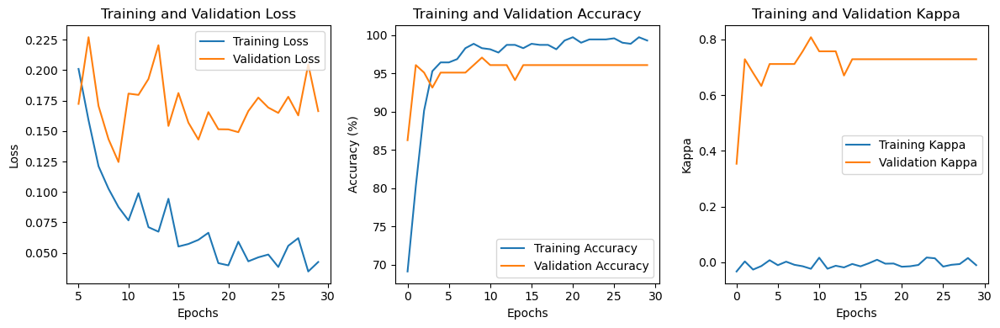

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  2 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5372525121678006, Training Accuracy: 71.85714285714286%, Avg. Validation Loss: 0.5186823095594134, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.42206012254411523, Training Accuracy: 83.14285714285714%, Avg. Validation Loss: 0.3620626670973642, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3227002058516849, Training Accuracy: 91.85714285714286%, Avg. Validation Loss: 0.3533675330025809, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2638780911537734, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.2578705485377993, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

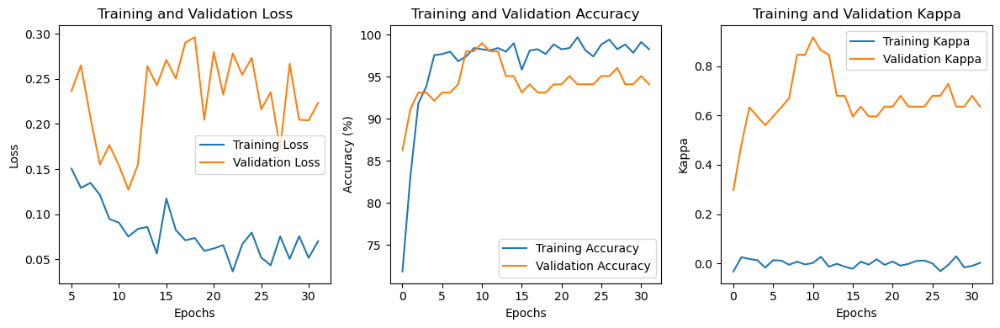

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  3 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7532851980491118, Training Accuracy: 54.42857142857143%, Avg. Validation Loss: 0.38205948046275545, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5281629155982625, Training Accuracy: 73.85714285714286%, Avg. Validation Loss: 0.1973314881324768, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3996108875355937, Training Accuracy: 87.0%, Avg. Validation Loss: 0.12272977083921432, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2916395210406997, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.152147898716586, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1760042076083

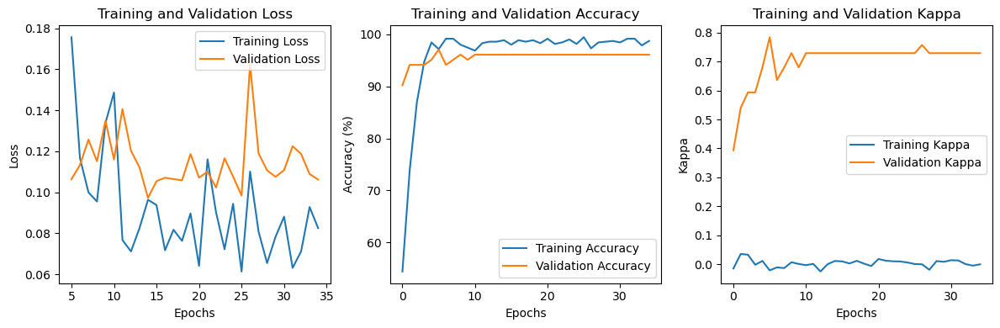

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.755210173083716
[[179   5]
 [  2  12]]
##################################### Iteration  4 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6475539674813097, Training Accuracy: 62.0%, Avg. Validation Loss: 0.45825023310525076, Validation Accuracy: 96.07843137254902%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4815921146761287, Training Accuracy: 82.14285714285714%, Avg. Validation Loss: 0.3141839589391436, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3845463733781468, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.24256108275481633, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.31793866983868857, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.3031245938369206, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.274000560695

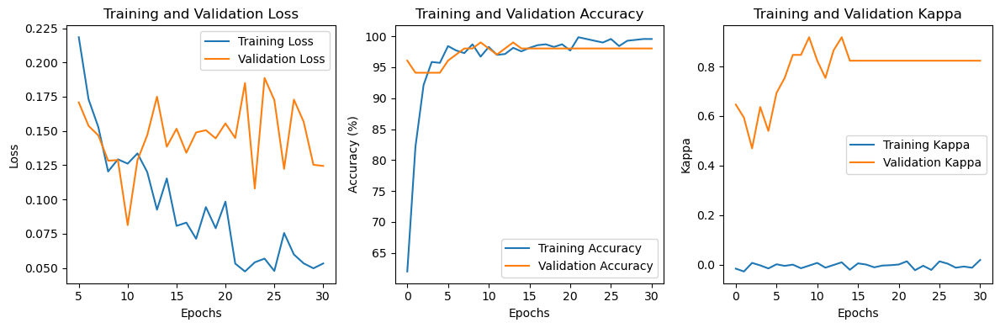

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  5 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7097099003466693, Training Accuracy: 56.42857142857143%, Avg. Validation Loss: 0.33620029262134005, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.48445601896806195, Training Accuracy: 80.42857142857143%, Avg. Validation Loss: 0.24085811419146402, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34084704010324046, Training Accuracy: 91.0%, Avg. Validation Loss: 0.22030998234237945, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2737358649345962, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.19254156095641, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.20670861632

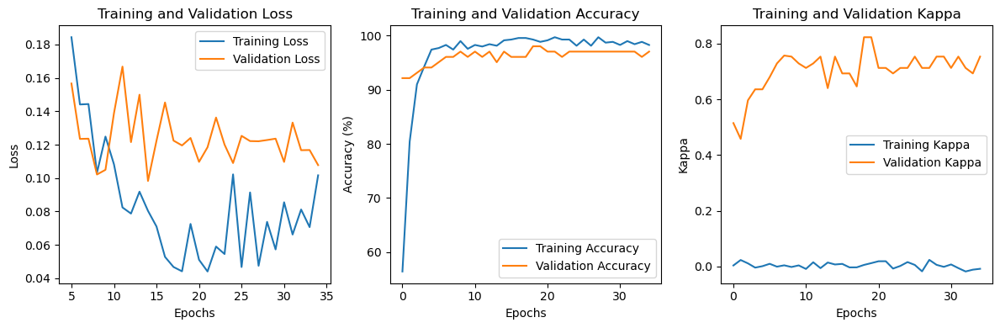

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  6 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7392906654964794, Training Accuracy: 50.857142857142854%, Avg. Validation Loss: 0.38332355873925344, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5867116288705305, Training Accuracy: 70.42857142857143%, Avg. Validation Loss: 0.2208431980439595, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36487833816896786, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.20171855602945601, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3162638975138014, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.16199000711951936, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

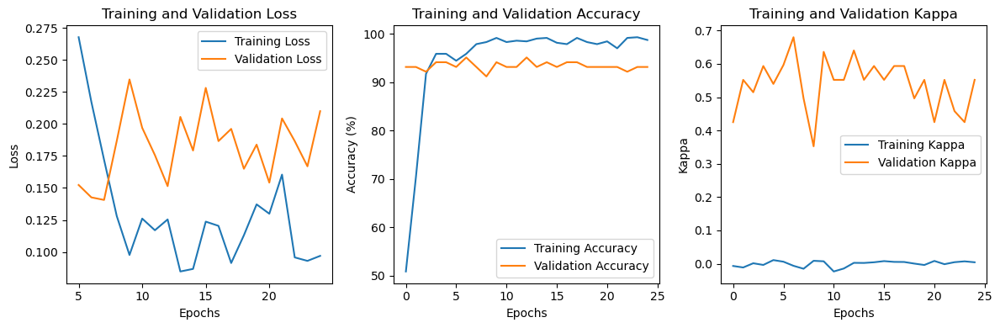

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  7 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6932471367445859, Training Accuracy: 54.285714285714285%, Avg. Validation Loss: 0.47304150462150574, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5556614216078412, Training Accuracy: 75.42857142857143%, Avg. Validation Loss: 0.2608417591878346, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4194505350156264, Training Accuracy: 93.0%, Avg. Validation Loss: 0.2328708874327796, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.36889560181986203, Training Accuracy: 95.0%, Avg. Validation Loss: 0.21221153225217546, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.29012105613946915, Trai

Epoch [41/10000], Avg. Training Loss: 0.054078439843248234, Training Accuracy: 99.0%, Avg. Validation Loss: 0.07950738711016518, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.02756588861600242, Training Accuracy: 100.0%, Avg. Validation Loss: 0.09757231441991669, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05959747136909176, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.06915064102837018, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.11418816252526912, Training Accuracy: 97.85714285714286%, Avg. Validation Loss: 0.059245486344609945, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.03881792952729897, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.06980858264224869, Validation Accuracy: 99.01960784313725%, lr: 1

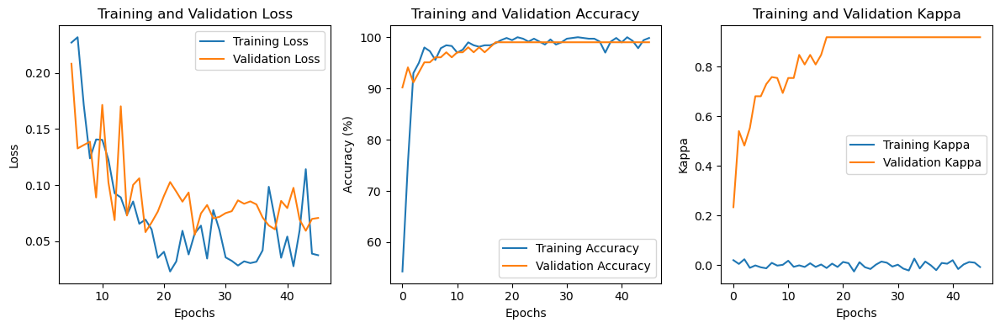

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  8 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7860028540546243, Training Accuracy: 53.285714285714285%, Avg. Validation Loss: 0.4488269260951451, Validation Accuracy: 82.3529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5757139541886069, Training Accuracy: 76.28571428571429%, Avg. Validation Loss: 0.18681551728929793, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4050403501499783, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.13454786262341908, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.292750034481287, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.14567116967269353, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [41/10000], Avg. Training Loss: 0.03893955970521678, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.13461492104189737, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04177821800112724, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.09980690585715431, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06786172138527036, Training Accuracy: 99.0%, Avg. Validation Loss: 0.12436069441693169, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07018592665818604, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.09888207646352905, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.044255129865963354, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.05732987608228411, Validation Accuracy: 99.01960784313

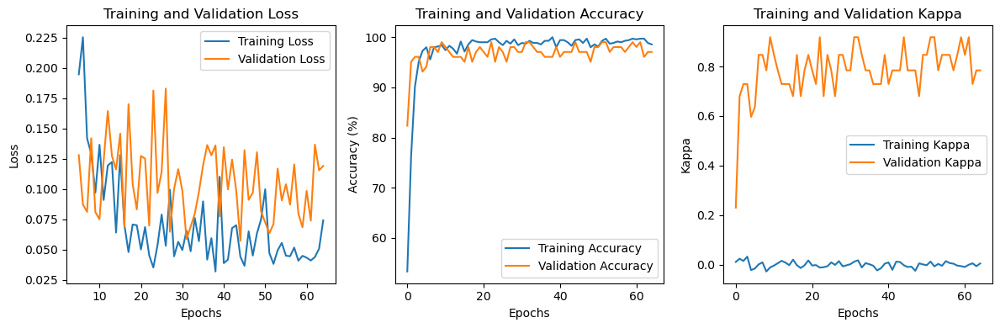

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  9 #####################################
Epoch [1/10000], Avg. Training Loss: 0.641860537908294, Training Accuracy: 64.42857142857143%, Avg. Validation Loss: 0.5049307772091457, Validation Accuracy: 83.33333333333333%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4441052973270416, Training Accuracy: 85.28571428571429%, Avg. Validation Loss: 0.2146670828972544, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.32403388213027606, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.18677850706236704, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2712585150518201, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.17565402601446425, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

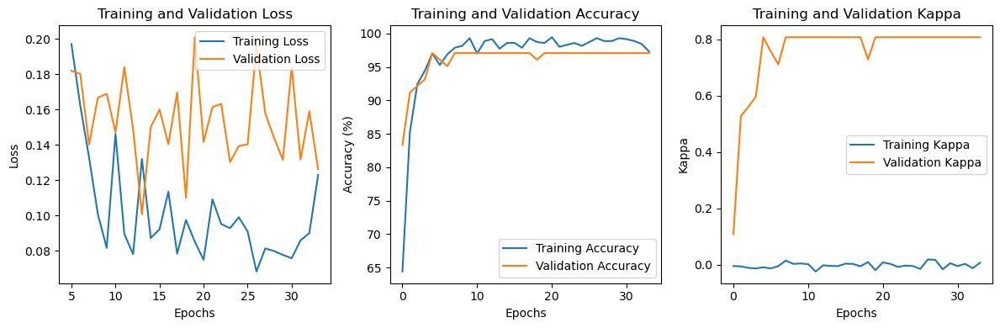

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7217984745082296
[[181   3]
 [  4  10]]
##################################### Iteration  10 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7448405000296506, Training Accuracy: 53.0%, Avg. Validation Loss: 0.40710014956338064, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5342141118916598, Training Accuracy: 73.85714285714286%, Avg. Validation Loss: 0.2593271519456591, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.33825369856574317, Training Accuracy: 90.42857142857143%, Avg. Validation Loss: 0.22190324855702265, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27734744481065055, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.17914896032639913, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.22349298

Epoch [42/10000], Avg. Training Loss: 0.1131079777313227, Training Accuracy: 97.14285714285714%, Avg. Validation Loss: 0.1363831428544862, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07630455493927002, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.11000386093344007, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07592632858590646, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.09911423096699375, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.051295530601319944, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.12845202748264586, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.07321103662252426, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.10771016670124871, Validation Accuracy: 98.

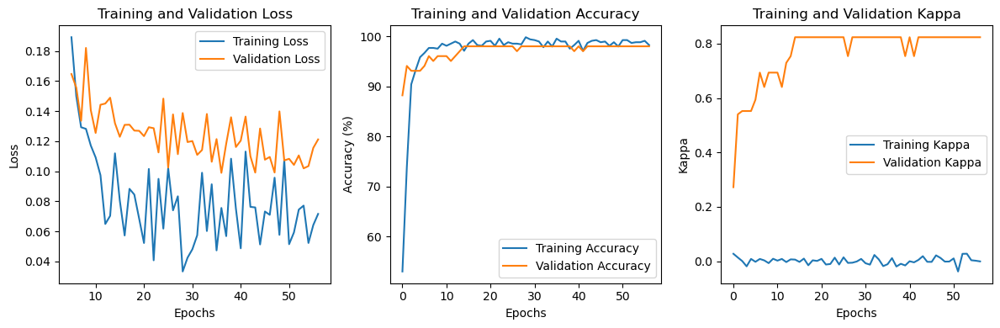

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8883878241262684
[[182   2]
 [  1  13]]
##################################### Iteration  11 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6269596815109253, Training Accuracy: 67.0%, Avg. Validation Loss: 0.5944720506668091, Validation Accuracy: 71.56862745098039%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.33534238724546, Training Accuracy: 87.14285714285714%, Avg. Validation Loss: 0.28946367757661, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.27664791386235843, Training Accuracy: 90.85714285714286%, Avg. Validation Loss: 0.2143527695110866, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.1791657917201519, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.15658966451883316, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.177879568866708

Epoch [41/10000], Avg. Training Loss: 0.06744047374972566, Training Accuracy: 97.85714285714286%, Avg. Validation Loss: 0.10186232998967171, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.11275728605687618, Training Accuracy: 97.28571428571429%, Avg. Validation Loss: 0.0841907262802124, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.039065820037979974, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.11437760346702167, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05780304684727029, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.12424615451267787, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07212833205068653, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.12311838673693794, Validation Accuracy: 98

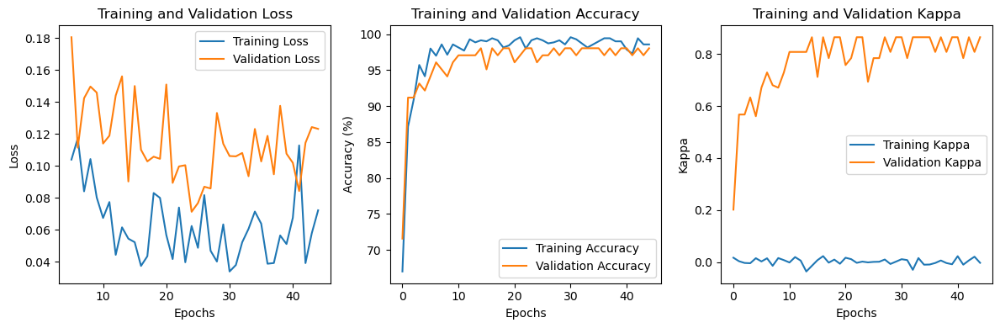

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  12 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6249085000970147, Training Accuracy: 67.57142857142857%, Avg. Validation Loss: 0.4615276498453958, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4490814493461089, Training Accuracy: 85.0%, Avg. Validation Loss: 0.26347985225064413, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34583925794471393, Training Accuracy: 92.14285714285714%, Avg. Validation Loss: 0.20594894566706248, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2500986169007691, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.20424497659717286, Validation Accuracy: 98.03921568627452%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.212348494

Epoch [41/10000], Avg. Training Loss: 0.07424243768169121, Training Accuracy: 98.0%, Avg. Validation Loss: 0.11053563441549029, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


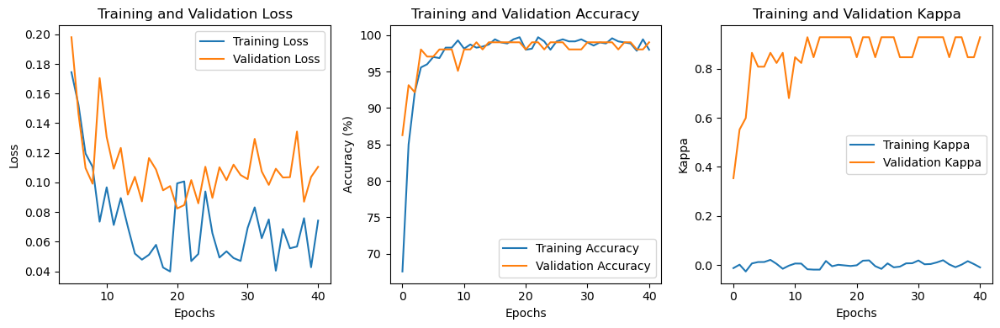

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9278951201747997
[[182   2]
 [  0  14]]
##################################### Iteration  13 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7100989324125376, Training Accuracy: 56.142857142857146%, Avg. Validation Loss: 0.5424140223434993, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5254910364747047, Training Accuracy: 76.42857142857143%, Avg. Validation Loss: 0.3149216834987913, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3514852967451919, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.25717390541519436, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2369754043492404, Training Accuracy: 95.0%, Avg. Validation Loss: 0.25062404200434685, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.19803968190

Epoch [42/10000], Avg. Training Loss: 0.0443847344934263, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.18475082090922765, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000002e-06
Epoch 00038: reducing learning rate of group 0 to 1.0000e-07.
Epoch [43/10000], Avg. Training Loss: 0.051654717842624945, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.16014483038868224, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.03838818147778511, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.1675985934478896, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.04183377676897428, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.164353252521583, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000002e-07
Epoch [46/10000], Avg. Training Loss: 0.04449189081788063, Training Accuracy: 99.57142857142857%, Avg. Va

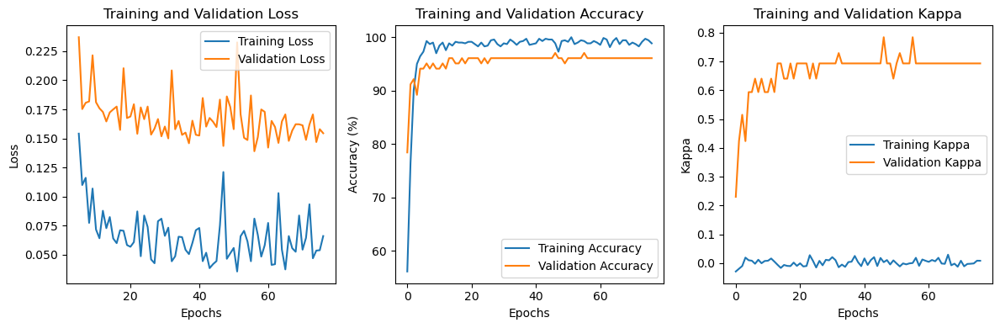

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.6852702225362063
[[178   6]
 [  3  11]]
##################################### Iteration  14 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5680653662844137, Training Accuracy: 71.85714285714286%, Avg. Validation Loss: 0.5891310232026237, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4327846711332148, Training Accuracy: 85.28571428571429%, Avg. Validation Loss: 0.40440567476408823, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3134891353547573, Training Accuracy: 92.0%, Avg. Validation Loss: 0.2785677718264716, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26630075208165427, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.24945989676884242, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.21596138365

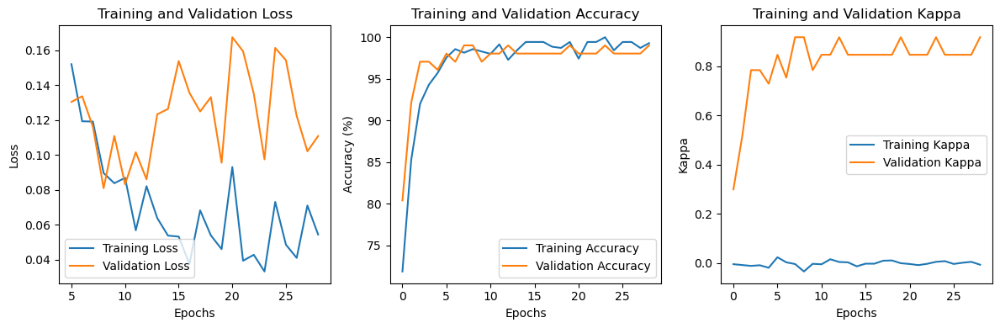

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  15 #####################################
Epoch [1/10000], Avg. Training Loss: 0.53668193586848, Training Accuracy: 72.71428571428571%, Avg. Validation Loss: 0.5143706628254482, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.410838934508237, Training Accuracy: 84.85714285714286%, Avg. Validation Loss: 0.3879308189664568, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31370154226368124, Training Accuracy: 90.42857142857143%, Avg. Validation Loss: 0.24565177517277853, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23401527072895656, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.22172739250319345, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

Epoch [41/10000], Avg. Training Loss: 0.042870179199698294, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.17601404498730386, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.02596076977947219, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11891642053212438, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05023279826326126, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.15660776676876204, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


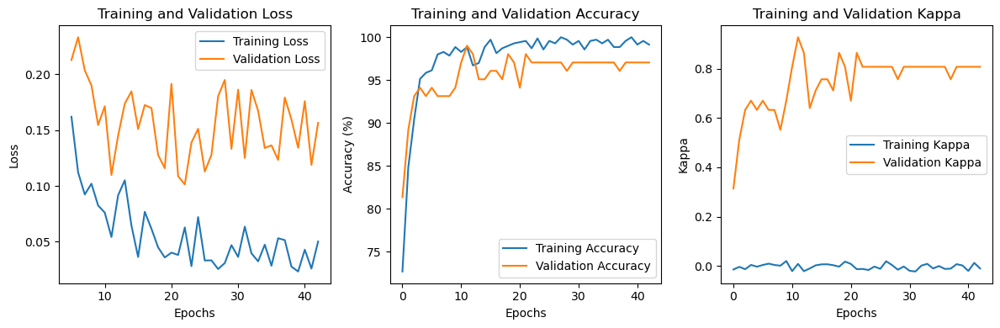

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]
##################################### Iteration  16 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7012996538118883, Training Accuracy: 58.0%, Avg. Validation Loss: 0.4327067349638258, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.556169983338226, Training Accuracy: 73.14285714285714%, Avg. Validation Loss: 0.31878637628895895, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.38622473552823067, Training Accuracy: 87.71428571428571%, Avg. Validation Loss: 0.25881544819899965, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25539699095216667, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.25657420073236736, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.263462928

Epoch [41/10000], Avg. Training Loss: 0.03661073693497614, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.10264622207198824, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.05904460795731707, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.11575305994067873, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.04443136234344407, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.12041303941181727, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06829227828844027, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.10716379593525614, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.0655753096904267, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.11590366065502167, Validation Accuracy: 97.

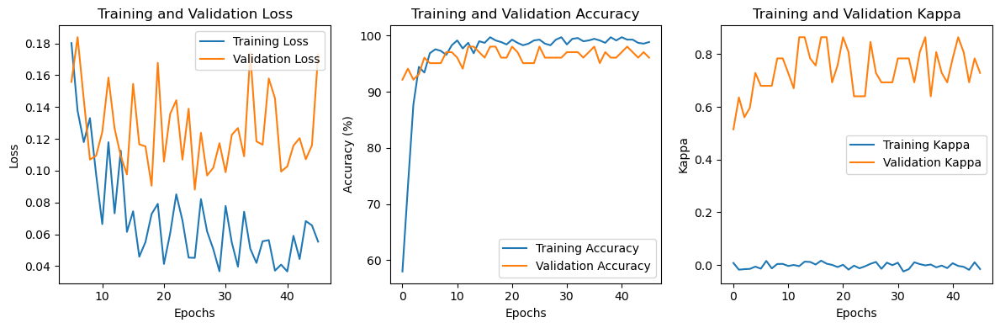

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  17 #####################################
Epoch [1/10000], Avg. Training Loss: 0.522789176214825, Training Accuracy: 80.28571428571429%, Avg. Validation Loss: 0.7881495015961784, Validation Accuracy: 46.07843137254902%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4034346403046088, Training Accuracy: 88.28571428571429%, Avg. Validation Loss: 0.5102866206850324, Validation Accuracy: 82.3529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31703695180741226, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.45908988799367634, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26027489792216907, Training Accuracy: 96.85714285714286%, Avg. Validation Loss: 0.2942608445882797, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

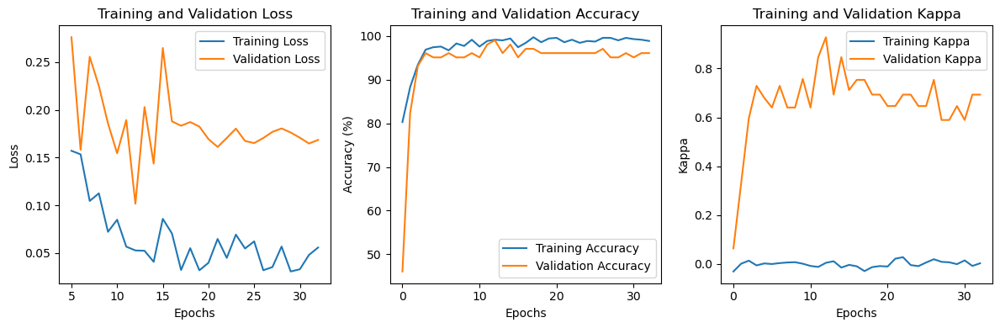

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7814569536423841
[[177   7]
 [  0  14]]
##################################### Iteration  18 #####################################
Epoch [1/10000], Avg. Training Loss: 0.735636296597394, Training Accuracy: 55.0%, Avg. Validation Loss: 0.4287214364324297, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5211392173712904, Training Accuracy: 76.0%, Avg. Validation Loss: 0.30381677406174795, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.32345138219269837, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.21584401386124746, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26479032229293475, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.22628534265926906, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.21762230094860902, Trai

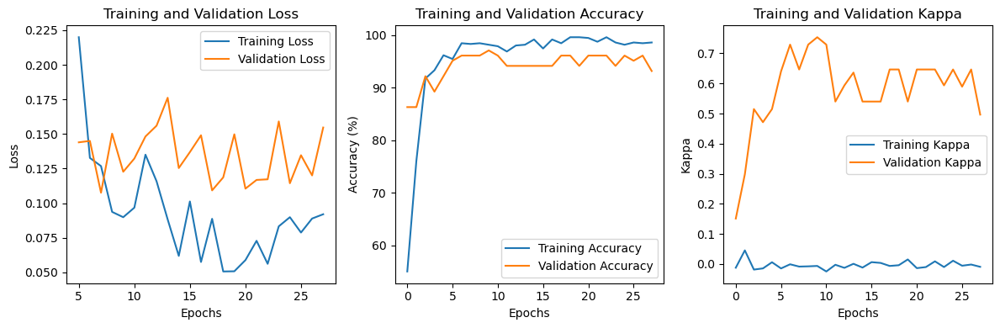

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  19 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6322661780498244, Training Accuracy: 68.85714285714286%, Avg. Validation Loss: 0.4816168759550367, Validation Accuracy: 76.47058823529412%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.40620788119056006, Training Accuracy: 87.42857142857143%, Avg. Validation Loss: 0.3193964532443455, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2912759388034994, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.31138221280915396, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2117543691261248, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.2884480825492314, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [41/10000], Avg. Training Loss: 0.04058780895800076, Training Accuracy: 99.0%, Avg. Validation Loss: 0.11927270250661033, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.06668276272036812, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.1002814665968929, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.03862043319862674, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10309285564082009, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.0336792984850366, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.1012673620134592, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.05328507859005847, Training Accuracy: 99.14285714285714%, Avg. Validation Loss

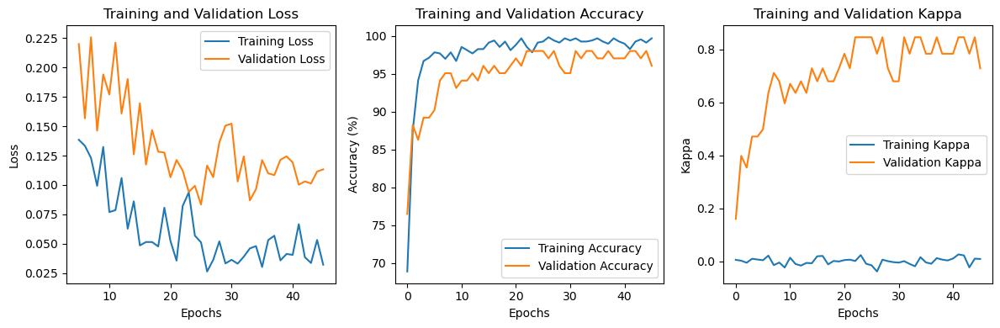

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  20 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7792055010795593, Training Accuracy: 53.857142857142854%, Avg. Validation Loss: 0.4061909445694515, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5012154531749812, Training Accuracy: 79.28571428571429%, Avg. Validation Loss: 0.28315926662513186, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.33512490310452203, Training Accuracy: 91.42857142857143%, Avg. Validation Loss: 0.2720337893281664, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2965868162837895, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.18328894994088582, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [40/10000], Avg. Training Loss: 0.06240102839232846, Training Accuracy: 99.0%, Avg. Validation Loss: 0.13042999697583063, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.05612828654491089, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.16198265233210155, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.08229832533238964, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.12414118328264781, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


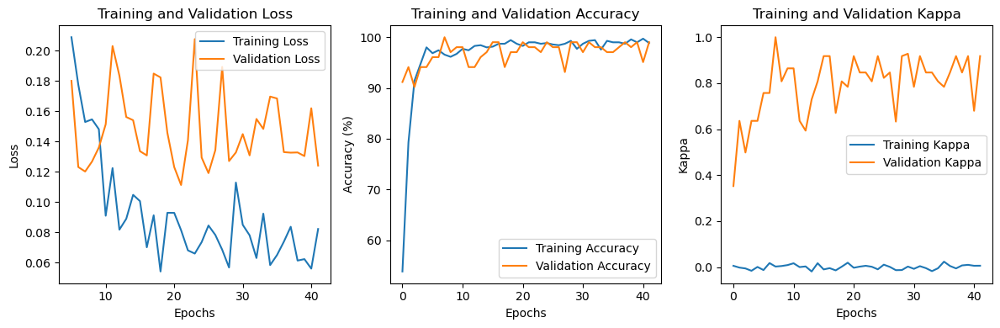

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  21 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5375938388434324, Training Accuracy: 74.71428571428571%, Avg. Validation Loss: 0.5012632182666233, Validation Accuracy: 84.31372549019608%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3875867812470956, Training Accuracy: 86.85714285714286%, Avg. Validation Loss: 0.28268527345997946, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3063397593796253, Training Accuracy: 92.57142857142857%, Avg. Validation Loss: 0.22505656523363932, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23078868131745944, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.23783434927463531, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [41/10000], Avg. Training Loss: 0.03477971137247302, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.13635734468698502, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.05626311115073887, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.14317200758627482, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05152542931451039, Training Accuracy: 99.0%, Avg. Validation Loss: 0.12212135536330086, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.043170429025353355, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.13028307844485557, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.057622782843695444, Training Accuracy: 99.0%, Avg. Validation Loss: 0.13382052470530784, Validation Accuracy: 98.03921568627452%, lr: 1.

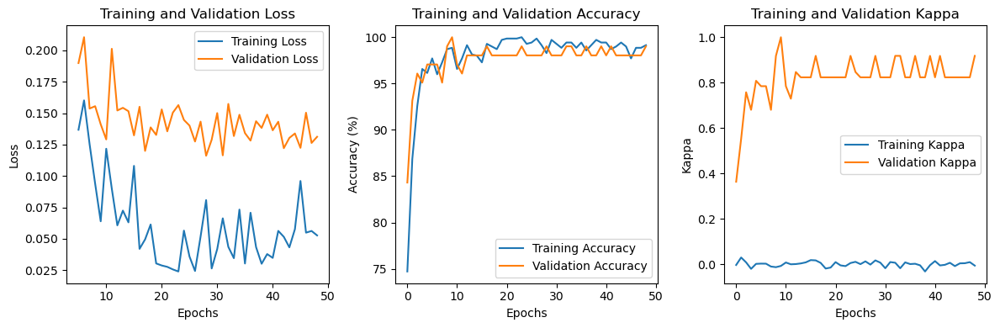

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  22 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5677842233668674, Training Accuracy: 71.28571428571429%, Avg. Validation Loss: 0.533802215542112, Validation Accuracy: 84.31372549019608%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.39160689914768393, Training Accuracy: 88.71428571428571%, Avg. Validation Loss: 0.3090199679136276, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2828266082162207, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.21188121714762279, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22890911183573984, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.21538768389395305, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [41/10000], Avg. Training Loss: 0.03611940636553548, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.11440233726586614, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


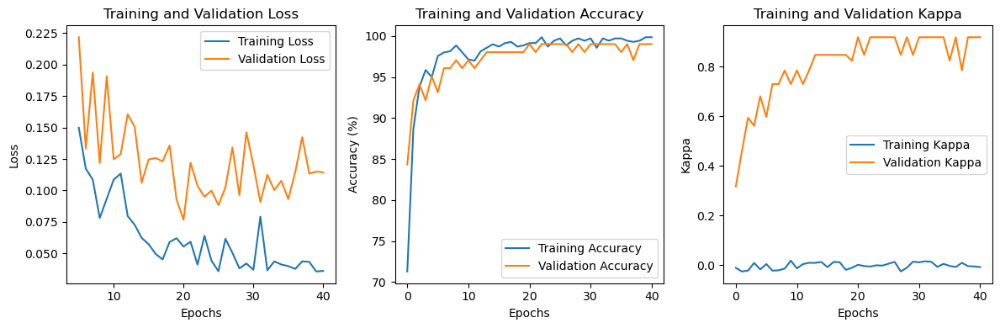

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  23 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5120181393894282, Training Accuracy: 76.57142857142857%, Avg. Validation Loss: 0.49246171968323843, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.342018951069225, Training Accuracy: 88.57142857142857%, Avg. Validation Loss: 0.288426473736763, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2489972117949616, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.20936268355165208, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.1974269403991374, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.17485589853354863, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

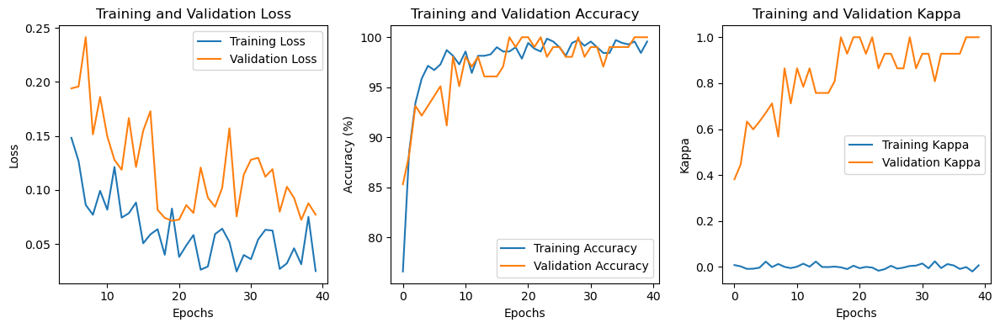

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8720379146919431
[[184   0]
 [  3  11]]
##################################### Iteration  24 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5932986025105823, Training Accuracy: 68.28571428571429%, Avg. Validation Loss: 0.7159208910805839, Validation Accuracy: 57.84313725490196%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.42194991355592554, Training Accuracy: 82.57142857142857%, Avg. Validation Loss: 0.46610367723873686, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3115289346738295, Training Accuracy: 91.14285714285714%, Avg. Validation Loss: 0.41295518619673593, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23106656020337885, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.33360282863889423, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

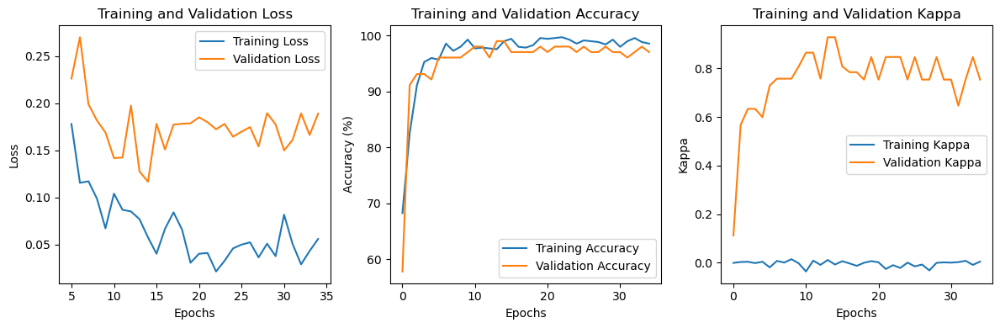

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  25 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5395955341783437, Training Accuracy: 74.28571428571429%, Avg. Validation Loss: 0.7110191583633423, Validation Accuracy: 56.86274509803921%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3635312867435542, Training Accuracy: 89.57142857142857%, Avg. Validation Loss: 0.4802802801132202, Validation Accuracy: 78.43137254901961%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.283540147610686, Training Accuracy: 93.57142857142857%, Avg. Validation Loss: 0.43348256605012075, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2218013002791188, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.3232652906860624, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

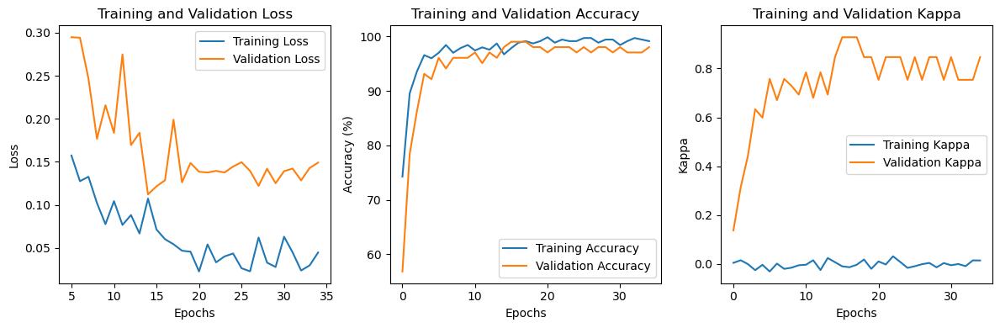

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8720379146919431
[[184   0]
 [  3  11]]
##################################### Iteration  26 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7444550340825861, Training Accuracy: 49.142857142857146%, Avg. Validation Loss: 0.38194980791636873, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6004637208851901, Training Accuracy: 68.28571428571429%, Avg. Validation Loss: 0.24819020926952362, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.39760795167901297, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.21447149344852992, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28479385477575386, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.16744362775768554, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training L

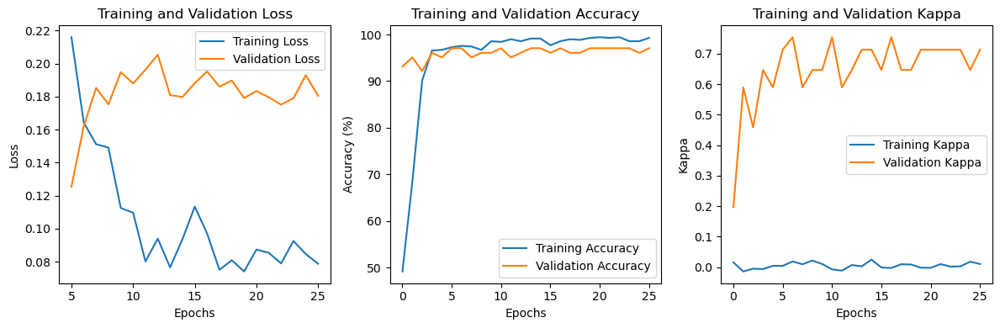

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8950900741787354
[[181   3]
 [  0  14]]
##################################### Iteration  27 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8345035233280875, Training Accuracy: 51.57142857142857%, Avg. Validation Loss: 0.32179147005081177, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5983853123404763, Training Accuracy: 69.71428571428571%, Avg. Validation Loss: 0.28205299164567676, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4656711034476757, Training Accuracy: 86.14285714285714%, Avg. Validation Loss: 0.13366278739912169, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3292921029708602, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.16567699504750116, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [41/10000], Avg. Training Loss: 0.03822144518860362, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.0783141159585544, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.049713663587516006, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08044452645948955, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07971119836226782, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.05217336783451693, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05279329643500122, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.07536254131368228, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.05265665850178762, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.06818347690360886, Validation Accuracy: 98

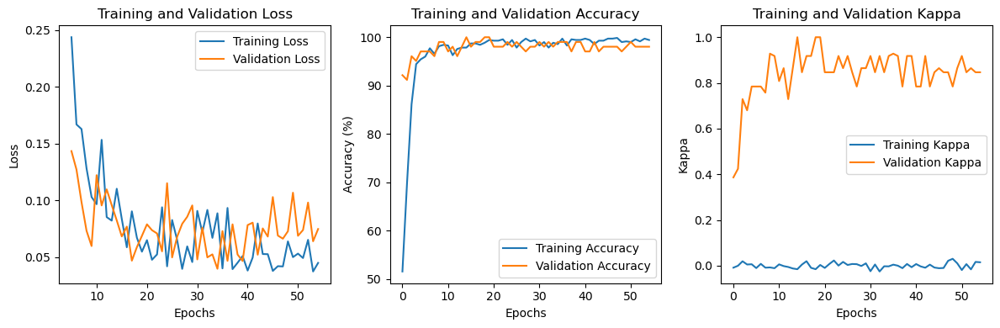

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7217984745082296
[[181   3]
 [  4  10]]
##################################### Iteration  28 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5137344537810846, Training Accuracy: 76.71428571428571%, Avg. Validation Loss: 0.45773634740284513, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3763835115188902, Training Accuracy: 88.57142857142857%, Avg. Validation Loss: 0.35353685702596394, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.28290066800334235, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.2779834270477295, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.20857147245921873, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.2943713345697948, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [41/10000], Avg. Training Loss: 0.031698800665749746, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.25348665033067974, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.03656558087095618, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.21858989340918406, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


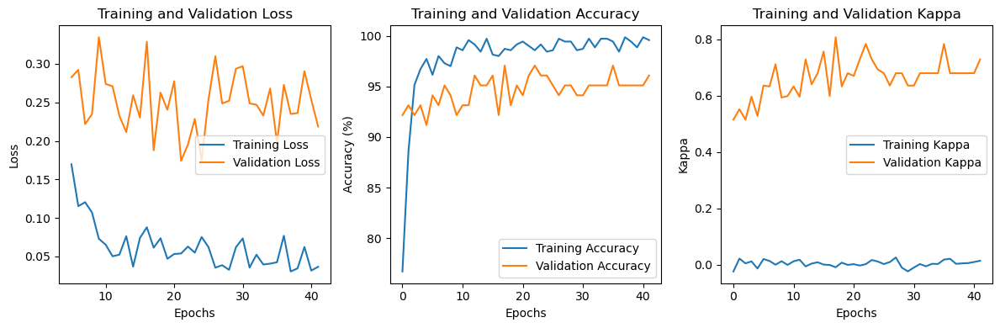

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.7867298578199052
[[183   1]
 [  4  10]]
##################################### Iteration  29 #####################################
Epoch [1/10000], Avg. Training Loss: 0.669167158278552, Training Accuracy: 64.0%, Avg. Validation Loss: 0.4421474167278835, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.44436659054322675, Training Accuracy: 80.14285714285714%, Avg. Validation Loss: 0.24725191295146942, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2939290292561054, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.22425485934529985, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23614091256802733, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.2303142888205392, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.20120799219

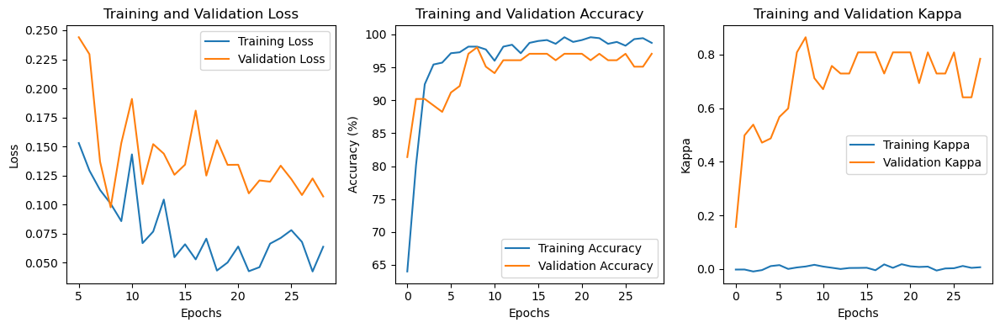

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  30 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6414757079698823, Training Accuracy: 60.57142857142857%, Avg. Validation Loss: 0.4365178091185434, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.502944330600175, Training Accuracy: 74.28571428571429%, Avg. Validation Loss: 0.3630033050264631, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3541260432790626, Training Accuracy: 87.71428571428571%, Avg. Validation Loss: 0.27693867470536915, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2943774333054369, Training Accuracy: 89.71428571428571%, Avg. Validation Loss: 0.1792335318667548, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

Epoch [41/10000], Avg. Training Loss: 0.024600762746889483, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.09635364583560399, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07115125861442224, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.055581926235130856, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.08135787171142345, Training Accuracy: 97.85714285714286%, Avg. Validation Loss: 0.09637822264007159, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.0782245302953842, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.07523547698344503, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.10327321233820509, Training Accuracy: 97.57142857142857%, Avg. Validation Loss: 0.07928340349878583, Validation Accuracy: 9

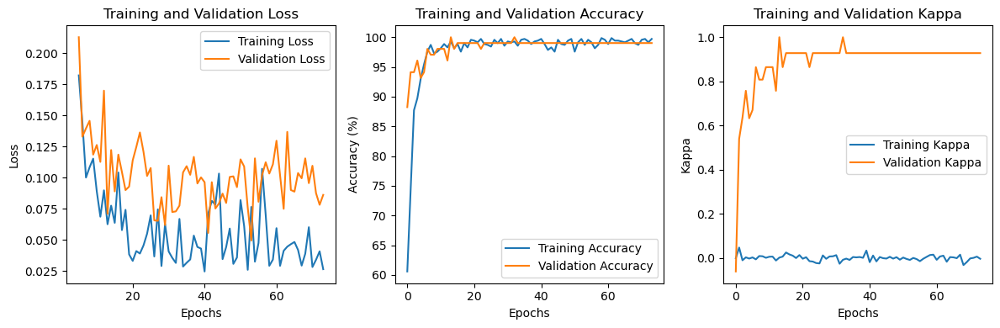

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  31 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7510088255459612, Training Accuracy: 54.57142857142857%, Avg. Validation Loss: 0.4529317021369934, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5448194715109739, Training Accuracy: 73.42857142857143%, Avg. Validation Loss: 0.3020684484924589, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3847521997310899, Training Accuracy: 86.85714285714286%, Avg. Validation Loss: 0.2388260034578187, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3253455693748864, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.1991095468401909, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2

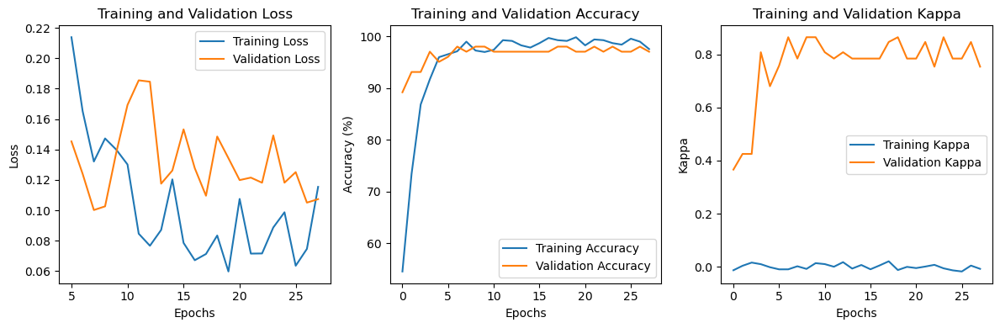

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  32 #####################################
Epoch [1/10000], Avg. Training Loss: 0.579179169779474, Training Accuracy: 73.57142857142857%, Avg. Validation Loss: 0.6790310059274945, Validation Accuracy: 52.94117647058823%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.49896526539867575, Training Accuracy: 82.71428571428571%, Avg. Validation Loss: 0.5424049326351711, Validation Accuracy: 85.29411764705883%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.39833995970812713, Training Accuracy: 90.42857142857143%, Avg. Validation Loss: 0.3924426180975778, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3113677335733717, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.3843262663909367, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [41/10000], Avg. Training Loss: 0.02855442667549307, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.11723701921956879, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.020106011789969423, Training Accuracy: 100.0%, Avg. Validation Loss: 0.13372464265142167, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05034911787052723, Training Accuracy: 99.0%, Avg. Validation Loss: 0.10897616669535637, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07649298763664608, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.0933162612574441, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


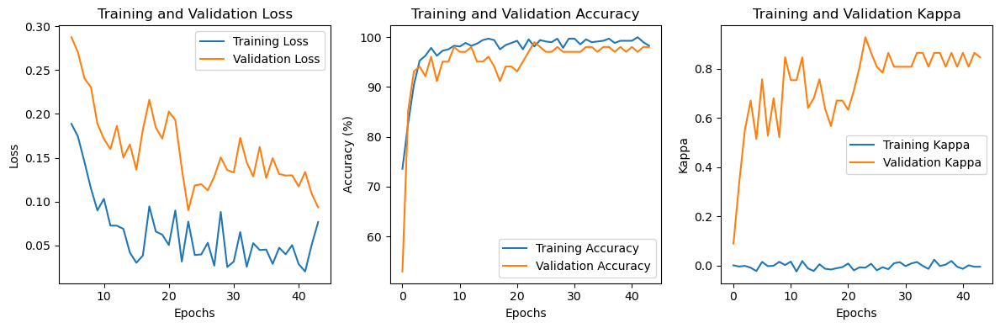

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  33 #####################################
Epoch [1/10000], Avg. Training Loss: 0.648013789545406, Training Accuracy: 63.285714285714285%, Avg. Validation Loss: 0.5145440357072013, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4934009076519446, Training Accuracy: 80.0%, Avg. Validation Loss: 0.3319464645215443, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36506116830489854, Training Accuracy: 90.0%, Avg. Validation Loss: 0.23355447607381002, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26533107696609065, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.20216331098760879, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.20571904629468918, Tra

Epoch [41/10000], Avg. Training Loss: 0.08551169169897382, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.12062827657376017, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0492260668172755, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.10764742163675171, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.08378479549322616, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.13325033975499018, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.0553113826635209, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.13341983620609557, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04846449615433812, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.11555827994431768, Validation Accuracy: 97.0

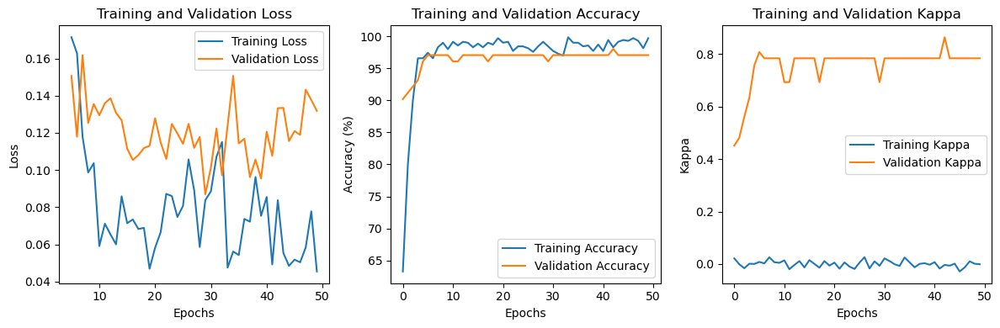

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.6423123243677238
[[180   4]
 [  5   9]]
##################################### Iteration  34 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6556718850677664, Training Accuracy: 64.14285714285714%, Avg. Validation Loss: 0.3806034965174539, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4879360781474547, Training Accuracy: 83.42857142857143%, Avg. Validation Loss: 0.2897655474288123, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3700815093788234, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.23922633060387202, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.31873851201751013, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.27751252480915617, Validation Accuracy: 88.23529411764706%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [40/10000], Avg. Training Loss: 0.06642824004996907, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.05156509046043668, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.06420314007184723, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.07669613403933388, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.10277340345253999, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.06545149268848556, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.04739032491025599, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.12102943978139333, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.0600920263254507, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.0579605262194361, Validation Accuracy: 99.0

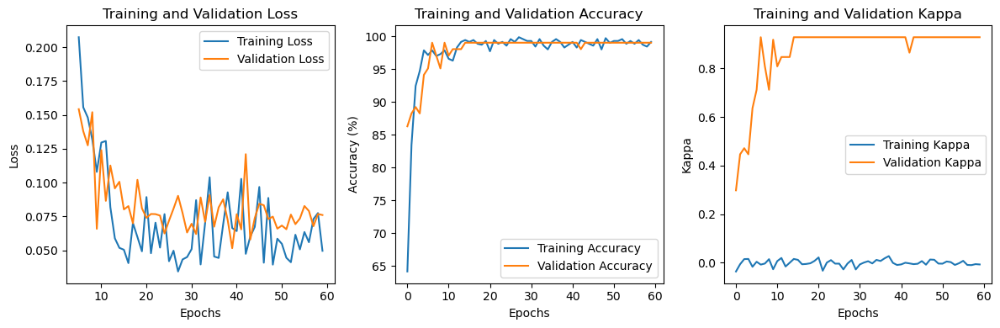

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9177057356608479
[[184   0]
 [  2  12]]
##################################### Iteration  35 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5681346092711795, Training Accuracy: 70.42857142857143%, Avg. Validation Loss: 0.4494564150060926, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4168062074617906, Training Accuracy: 83.42857142857143%, Avg. Validation Loss: 0.2730488010815212, Validation Accuracy: 97.05882352941177%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.27995949441736395, Training Accuracy: 91.57142857142857%, Avg. Validation Loss: 0.19514637972627366, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.17581067691472443, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.1047319338790008, Validation Accuracy: 99.01960784313725%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [41/10000], Avg. Training Loss: 0.050594906618987974, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.14192257449030876, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07334681371734901, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.10053476371935435, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


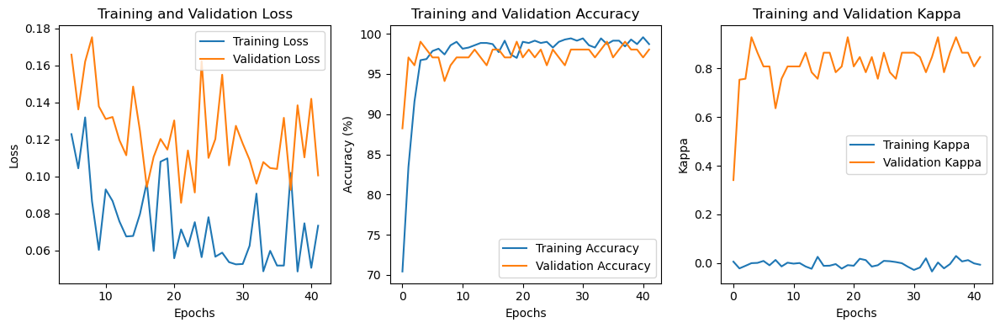

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7343470483005367
[[183   1]
 [  5   9]]
##################################### Iteration  36 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7912733229723844, Training Accuracy: 52.142857142857146%, Avg. Validation Loss: 0.3904473526137216, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4978085160255432, Training Accuracy: 76.14285714285714%, Avg. Validation Loss: 0.2301066986152104, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34239831871607085, Training Accuracy: 90.71428571428571%, Avg. Validation Loss: 0.15308630147150584, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25806685943495145, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.1645993675504412, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [40/10000], Avg. Training Loss: 0.057302139487794855, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.06786807147519928, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.06184690551493655, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.07094245350786618, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.10789355885406787, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.12185609127793993, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.046556063843044365, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.11420579999685287, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06369713765823028, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.06153283268213272, Validation Accuracy: 

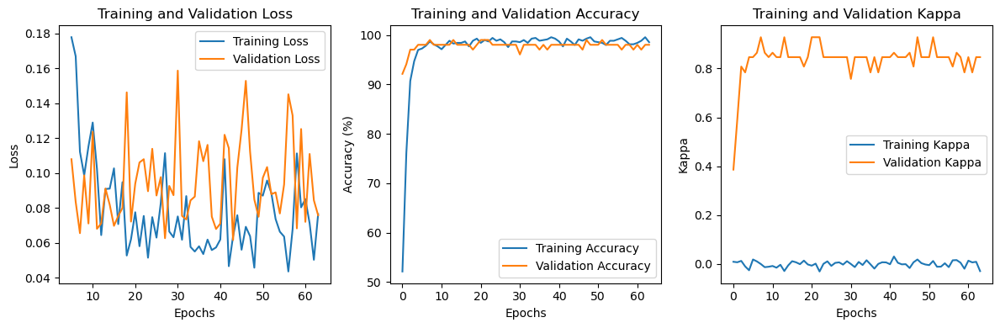

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  37 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6524229076775637, Training Accuracy: 62.0%, Avg. Validation Loss: 0.5213941804000309, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4987535002556714, Training Accuracy: 78.28571428571429%, Avg. Validation Loss: 0.28894526830741335, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3564111109484326, Training Accuracy: 90.0%, Avg. Validation Loss: 0.19342817259686335, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2631998664953492, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.18133144080638885, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.22162068686024708, Trai

Epoch [42/10000], Avg. Training Loss: 0.0205512563909658, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.08473813427346093, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.04645036439284344, Training Accuracy: 99.0%, Avg. Validation Loss: 0.09808491383280073, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05232734914699739, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.07148561999201775, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.023012812873771923, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.09242844049419675, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.025479770127937874, Training Accuracy: 99.71428571428571%, Avg. Validation 

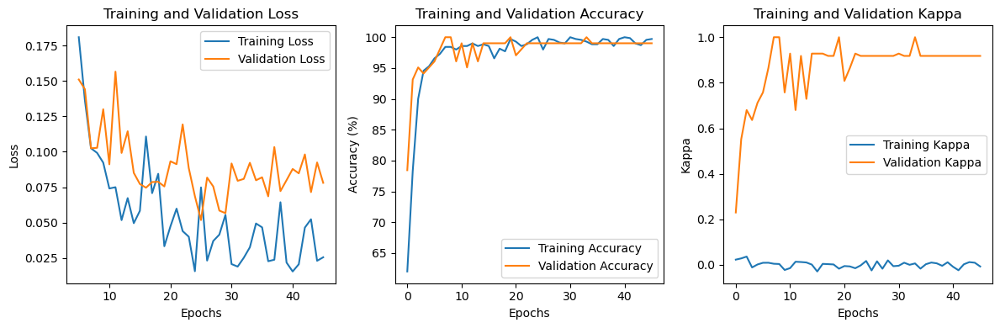

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  38 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7520384029908613, Training Accuracy: 52.857142857142854%, Avg. Validation Loss: 0.331519861306463, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5129708762873303, Training Accuracy: 72.71428571428571%, Avg. Validation Loss: 0.23066118359565735, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4112821810624816, Training Accuracy: 86.71428571428571%, Avg. Validation Loss: 0.1810928572501455, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2858707098798318, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.13495113807065146, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

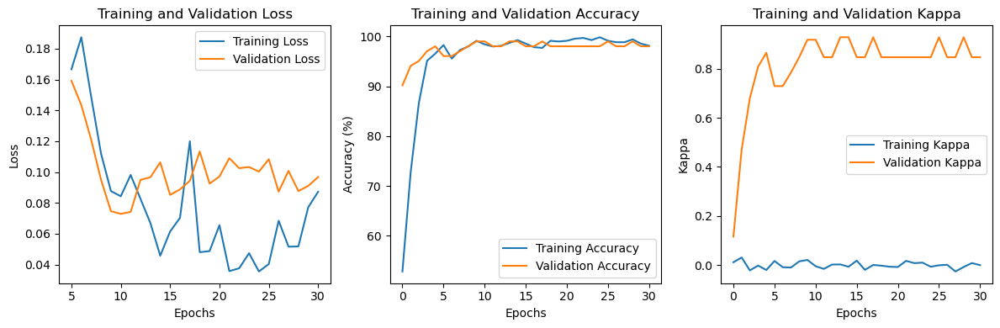

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  39 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5090632465752688, Training Accuracy: 77.42857142857143%, Avg. Validation Loss: 0.5083630723612649, Validation Accuracy: 77.45098039215686%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3192588961259885, Training Accuracy: 89.85714285714286%, Avg. Validation Loss: 0.314011139529092, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.24504255740479988, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.266552461045129, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.19737525572153655, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.2074300657425608, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

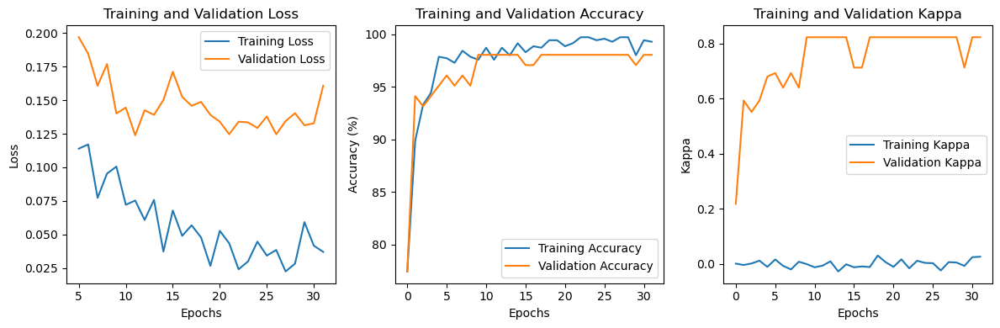

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7395715896279594
[[180   4]
 [  3  11]]
##################################### Iteration  40 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6611448986963793, Training Accuracy: 61.857142857142854%, Avg. Validation Loss: 0.4191882993493761, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4497618289156394, Training Accuracy: 82.42857142857143%, Avg. Validation Loss: 0.3114443804536547, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3326886912638491, Training Accuracy: 90.71428571428571%, Avg. Validation Loss: 0.17045493636812484, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2627544389529662, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.1669188482420785, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [41/10000], Avg. Training Loss: 0.056591199499300936, Training Accuracy: 99.0%, Avg. Validation Loss: 0.09877901843615941, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0511686181310903, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10746433798755918, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06160674210299145, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.11832123569079808, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.06601296200162986, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10937715534652982, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07704739272594452, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.10325758372034345, Validation Accuracy: 99.019607843137

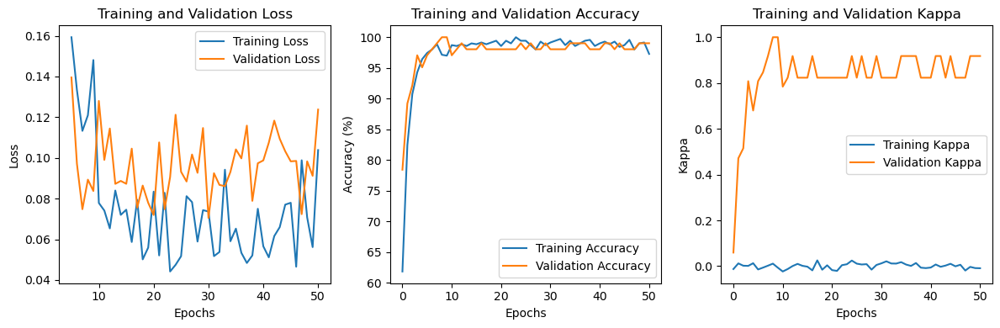

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7433570965651328
[[177   7]
 [  1  13]]
##################################### Iteration  41 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7694057307460092, Training Accuracy: 46.714285714285715%, Avg. Validation Loss: 0.34083642278398785, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.565860471942208, Training Accuracy: 72.28571428571429%, Avg. Validation Loss: 0.23829256849629538, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4386624646457759, Training Accuracy: 87.42857142857143%, Avg. Validation Loss: 0.20501862466335297, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3431069688363509, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.1734281661255019, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

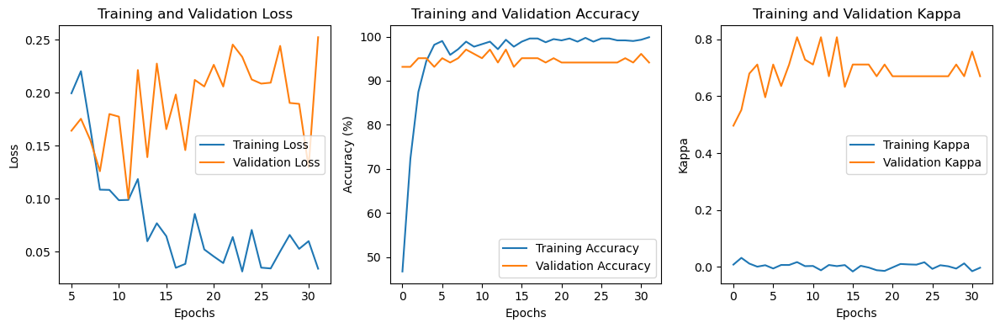

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.8075178224238496
[[178   6]
 [  0  14]]
##################################### Iteration  42 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7219904823736711, Training Accuracy: 53.57142857142857%, Avg. Validation Loss: 0.35861791031701223, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5256358520551161, Training Accuracy: 75.71428571428571%, Avg. Validation Loss: 0.2350009615932192, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36330596188252623, Training Accuracy: 91.57142857142857%, Avg. Validation Loss: 0.27671264324869427, Validation Accuracy: 87.25490196078431%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27243714237754996, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.20679708463805063, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

Epoch [41/10000], Avg. Training Loss: 0.08182778848673809, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.07873537497861045, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [42/10000], Avg. Training Loss: 0.03721636309373108, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.1285805372255189, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch 00038: reducing learning rate of group 0 to 1.0000e-08.
Epoch [43/10000], Avg. Training Loss: 0.10508295986801386, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.07640574766056878, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.04056131530722434, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10625867226294108, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07654860543764451, Training Accuracy: 98.14285714285714%, Avg. 

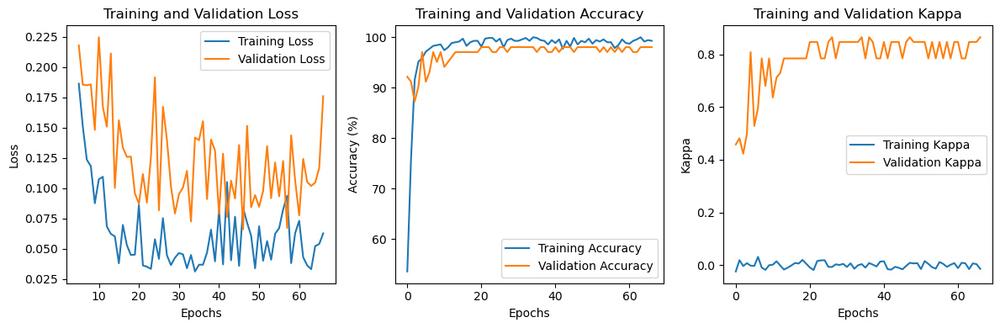

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.6651634723788049
[[179   5]
 [  4  10]]
##################################### Iteration  43 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8486275252970782, Training Accuracy: 53.714285714285715%, Avg. Validation Loss: 0.29867120725767954, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6117408587173983, Training Accuracy: 69.71428571428571%, Avg. Validation Loss: 0.26771064049431254, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4057710651646961, Training Accuracy: 89.85714285714286%, Avg. Validation Loss: 0.2279260073389326, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2999722354791381, Training Accuracy: 92.57142857142857%, Avg. Validation Loss: 0.2448675451534135, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

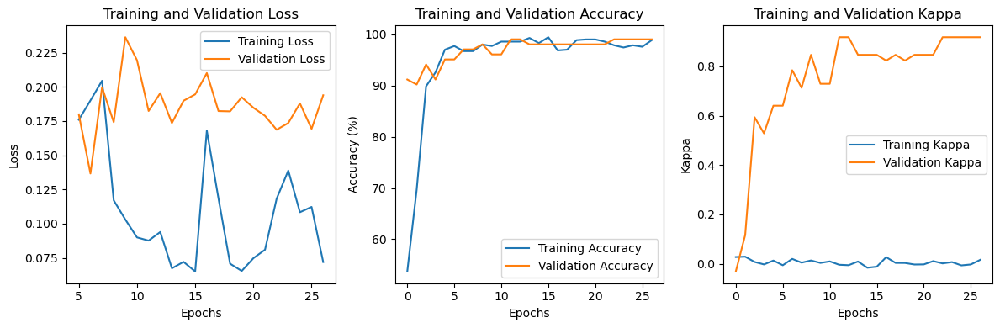

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.7030989670109964
[[177   7]
 [  2  12]]
##################################### Iteration  44 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7555828595703299, Training Accuracy: 43.42857142857143%, Avg. Validation Loss: 0.3981500906603677, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5891131575811993, Training Accuracy: 69.42857142857143%, Avg. Validation Loss: 0.2865626152072634, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4786300550807606, Training Accuracy: 84.71428571428571%, Avg. Validation Loss: 0.25945158089910236, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.40253011746840045, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.20786459743976593, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [40/10000], Avg. Training Loss: 0.0626690938052806, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.1015344677226884, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.08889368692920967, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.09485231127057757, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.14530311042273586, Training Accuracy: 97.42857142857143%, Avg. Validation Loss: 0.06437146982976369, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.10357136736539277, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.092830198683909, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07541352044790983, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.08749895755733762, Validation Accuracy: 98.039

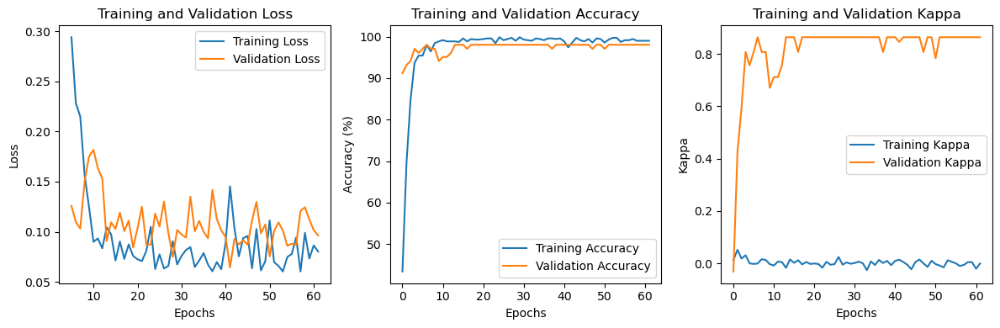

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.7867298578199052
[[183   1]
 [  4  10]]
##################################### Iteration  45 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6914323371919718, Training Accuracy: 59.42857142857143%, Avg. Validation Loss: 0.5767070821353367, Validation Accuracy: 76.47058823529412%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4697418348355727, Training Accuracy: 83.14285714285714%, Avg. Validation Loss: 0.3553052395582199, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34053700078617444, Training Accuracy: 92.0%, Avg. Validation Loss: 0.32109159231185913, Validation Accuracy: 88.23529411764706%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27515251392667944, Training Accuracy: 94.42857142857143%, Avg. Validation Loss: 0.23814630721296584, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.207577857

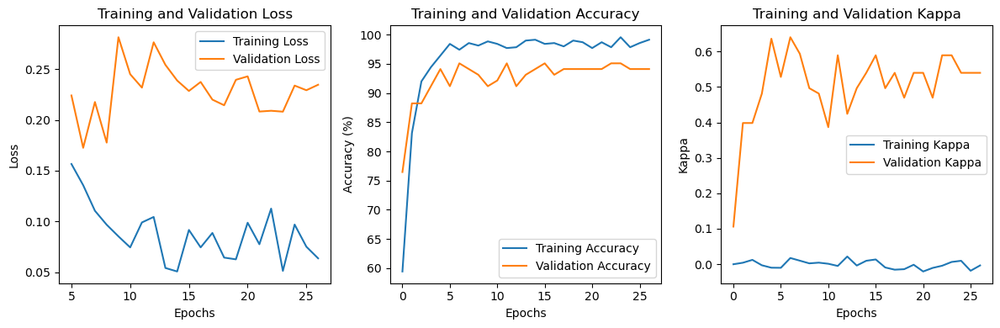

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7836853605243992
[[180   4]
 [  2  12]]
##################################### Iteration  46 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6004960286346349, Training Accuracy: 68.28571428571429%, Avg. Validation Loss: 0.5283481223242623, Validation Accuracy: 82.3529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4148423292420127, Training Accuracy: 84.71428571428571%, Avg. Validation Loss: 0.3671538233757019, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.30450691079551523, Training Accuracy: 92.57142857142857%, Avg. Validation Loss: 0.2904450637953622, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23296062885360283, Training Accuracy: 96.0%, Avg. Validation Loss: 0.23766608110495976, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.200937537645

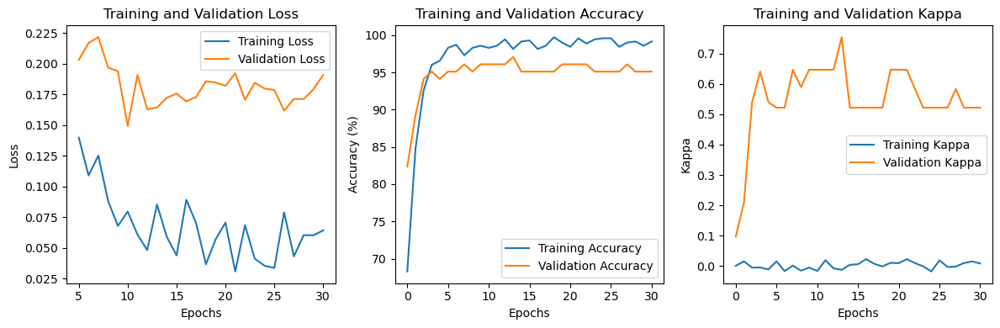

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7283950617283951
[[178   6]
 [  2  12]]
##################################### Iteration  47 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7270037139003928, Training Accuracy: 56.714285714285715%, Avg. Validation Loss: 0.43372386268207, Validation Accuracy: 76.47058823529412%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.48736310276118194, Training Accuracy: 83.28571428571429%, Avg. Validation Loss: 0.26530101682458607, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3914067128842527, Training Accuracy: 90.42857142857143%, Avg. Validation Loss: 0.2469256775719779, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28622823750430887, Training Accuracy: 96.28571428571429%, Avg. Validation Loss: 0.20647608595235006, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [41/10000], Avg. Training Loss: 0.06594770215451717, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.11506583328757967, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.08208902180194855, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.09879277673150812, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05294607037847692, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.10986139252781868, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.08260273141786456, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.10122370666691236, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.07842323522676121, Training Accuracy: 99.0%, Avg. Validation Loss: 0.09988148058099407, Validation Accuracy: 95.098039215686

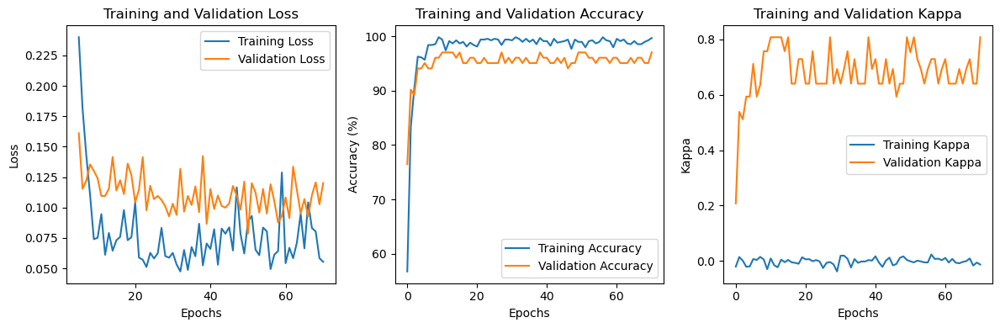

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6925465838509317
[[180   4]
 [  4  10]]
##################################### Iteration  48 #####################################
Epoch [1/10000], Avg. Training Loss: 0.817804522135041, Training Accuracy: 48.714285714285715%, Avg. Validation Loss: 0.31848604338509695, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5966577672145583, Training Accuracy: 69.28571428571429%, Avg. Validation Loss: 0.2020940982869693, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4743603684685447, Training Accuracy: 84.71428571428571%, Avg. Validation Loss: 0.21667359237160003, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3945168426091021, Training Accuracy: 93.42857142857143%, Avg. Validation Loss: 0.12925854325294495, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [41/10000], Avg. Training Loss: 0.056957074483348566, Training Accuracy: 99.0%, Avg. Validation Loss: 0.1330381626529353, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.06158716278150678, Training Accuracy: 99.0%, Avg. Validation Loss: 0.11384312994778156, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07522557849403132, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.10740149979080472, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07472422481937842, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.1098338400146791, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.04940595888448032, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.17688215523958206, Validation Accuracy: 95.09803921568627%, lr: 1.000

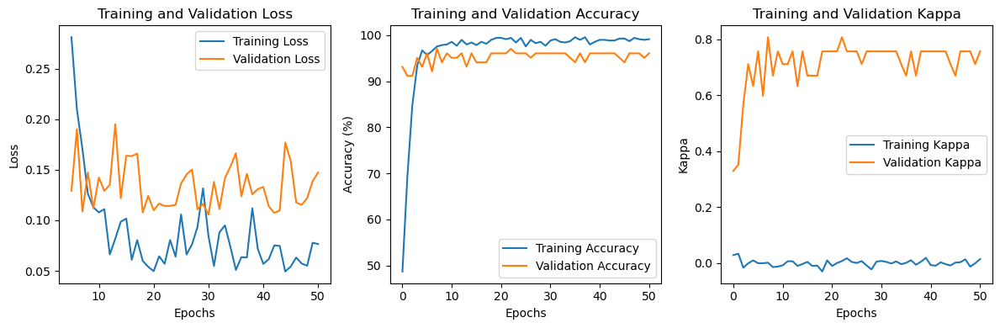

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.7190160832544938
[[176   8]
 [  1  13]]
##################################### Iteration  49 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5704014084555886, Training Accuracy: 68.85714285714286%, Avg. Validation Loss: 0.5767965912818909, Validation Accuracy: 74.50980392156863%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.38572822748260066, Training Accuracy: 86.42857142857143%, Avg. Validation Loss: 0.2833092638424465, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2672955302352255, Training Accuracy: 93.0%, Avg. Validation Loss: 0.2500134695853506, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.19822062975303692, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.22446665167808533, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1650135435

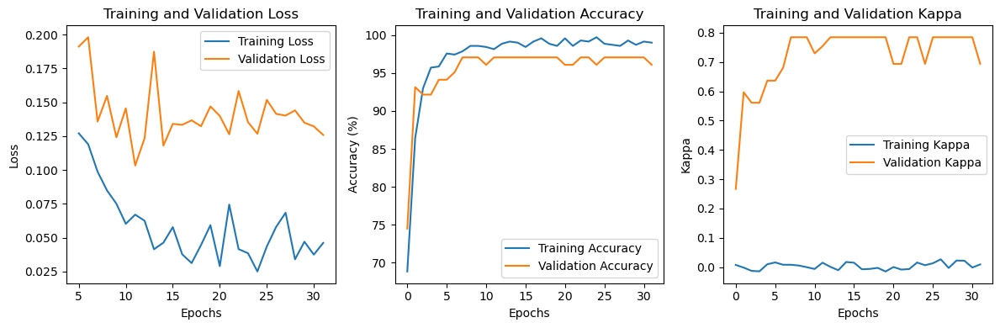

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  50 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6027499985965815, Training Accuracy: 67.57142857142857%, Avg. Validation Loss: 0.5523175001144409, Validation Accuracy: 83.33333333333333%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4542274393818595, Training Accuracy: 81.85714285714286%, Avg. Validation Loss: 0.36030652267592295, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.35161779075860977, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.298801777618272, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28738790107044304, Training Accuracy: 92.57142857142857%, Avg. Validation Loss: 0.2898735318865095, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [41/10000], Avg. Training Loss: 0.05867596717805348, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.08542978603925024, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.030506847553293814, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.14030131910528457, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.05710014751689001, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.08542353446994509, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03330916202288459, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.09920733209167208, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06657259968448091, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.10880684320415769, Validation Accuracy: 9

Epoch [81/10000], Avg. Training Loss: 0.027561509685421533, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.11578397027083806, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [82/10000], Avg. Training Loss: 0.042512883453375915, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.10152521623032433, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [83/10000], Avg. Training Loss: 0.0311521546788175, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.09954770441566195, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [84/10000], Avg. Training Loss: 0.044184670127420264, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.12223514488765172, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [85/10000], Avg. Training Loss: 0.03233828973448412, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.11590851524046489, Validation Accuracy: 

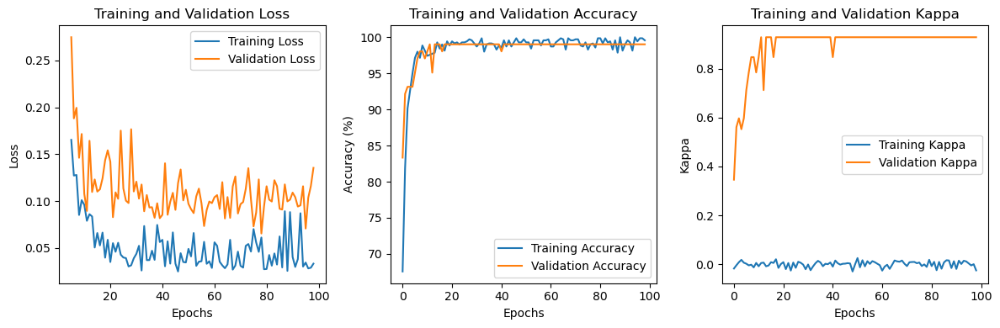

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.7867298578199052
[[183   1]
 [  4  10]]
##################################### Iteration  51 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6753064698793672, Training Accuracy: 61.42857142857143%, Avg. Validation Loss: 0.45514723658561707, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.44021365520629013, Training Accuracy: 83.57142857142857%, Avg. Validation Loss: 0.2582680284976959, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3209467533637177, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.20184489978211267, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24053724821318279, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.2272115754229682, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

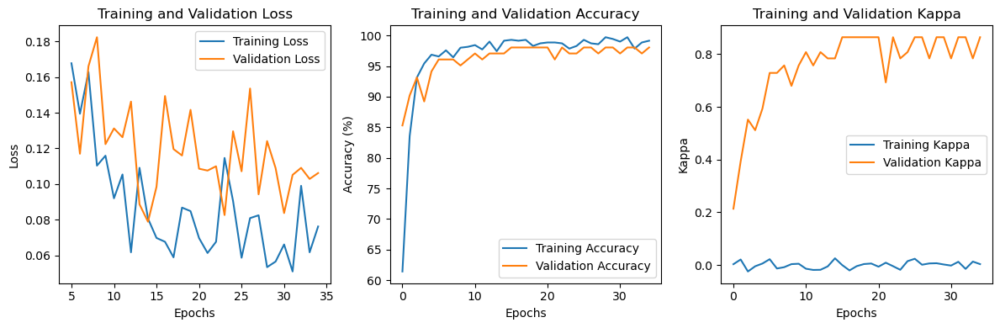

Accuracy of the network on the test set: 94.94949494949495 %, kappa: 0.6604938271604939
[[177   7]
 [  3  11]]
##################################### Iteration  52 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8659344545819543, Training Accuracy: 51.714285714285715%, Avg. Validation Loss: 0.2795208671263286, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6098449460484765, Training Accuracy: 72.85714285714286%, Avg. Validation Loss: 0.16384998283215932, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3809949630363421, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.11964147857257298, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3166668432002718, Training Accuracy: 93.14285714285714%, Avg. Validation Loss: 0.10626869329384395, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [40/10000], Avg. Training Loss: 0.11273866544731638, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.0952141745282071, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.11157048535956578, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.08732782809862069, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.09101222345436161, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.09279330181224006, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


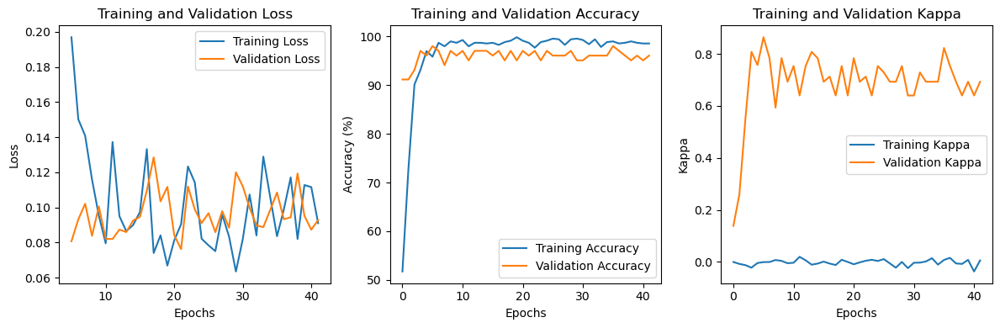

Accuracy of the network on the test set: 94.44444444444444 %, kappa: 0.6565752128666036
[[175   9]
 [  2  12]]
##################################### Iteration  53 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5078392706134103, Training Accuracy: 76.71428571428571%, Avg. Validation Loss: 0.7223841888563973, Validation Accuracy: 52.94117647058823%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.38697231459346687, Training Accuracy: 86.57142857142857%, Avg. Validation Loss: 0.4882113252367292, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.251519708132202, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.4143089992659433, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.20122736438431524, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.3499028129237039, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

Epoch [43/10000], Avg. Training Loss: 0.060893025947734714, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.10320517952953066, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.061732677996835926, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.07911055801170212, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.03806507953611964, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.1026551223226956, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Epoch [46/10000], Avg. Training Loss: 0.02685470984910022, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.08563269568341118, Validation Accuracy: 100.0%, lr: 1.0000000000000002e-07
Epoch 00042: reducing learning rate of group 0 to 1.0000e-08.
Epoch [47/10000], Avg. Training Loss: 0.033334998223422604, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.08005959008421216, Validat

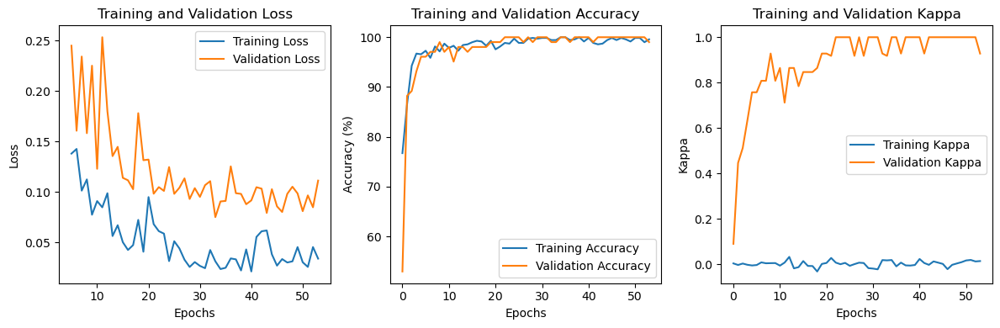

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  54 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8149074668234045, Training Accuracy: 49.42857142857143%, Avg. Validation Loss: 0.435408068554742, Validation Accuracy: 87.25490196078431%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5430722974918105, Training Accuracy: 74.85714285714286%, Avg. Validation Loss: 0.3005701143826757, Validation Accuracy: 87.25490196078431%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3908838978545232, Training Accuracy: 88.0%, Avg. Validation Loss: 0.30109961863074985, Validation Accuracy: 86.27450980392157%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26615719802000304, Training Accuracy: 96.14285714285714%, Avg. Validation Loss: 0.2564107392515455, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.215228023515

Epoch [41/10000], Avg. Training Loss: 0.03847449871880764, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.17204604670405388, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04023954424668442, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.17299289415989602, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.03430134494026953, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.183523954557521, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.058810464699159966, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.17047443560191564, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.06028756145811216, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.1714547694261585, Validation Accuracy: 96.0

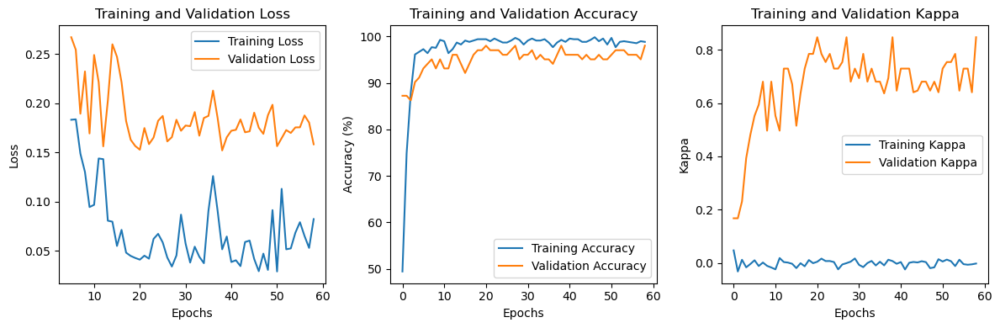

Accuracy of the network on the test set: 99.4949494949495 %, kappa: 0.9627959413754228
[[183   1]
 [  0  14]]
##################################### Iteration  55 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6313092735680667, Training Accuracy: 61.714285714285715%, Avg. Validation Loss: 0.5633485061781747, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5056044811552222, Training Accuracy: 76.14285714285714%, Avg. Validation Loss: 0.39485118218830656, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36768311126665637, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.3591115304401943, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.299089059910991, Training Accuracy: 93.28571428571429%, Avg. Validation Loss: 0.26508642945970806, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

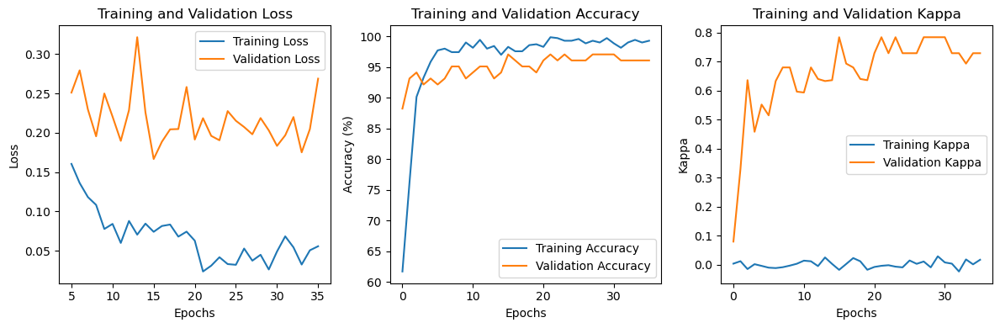

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.7814569536423841
[[177   7]
 [  0  14]]
##################################### Iteration  56 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5722443969412283, Training Accuracy: 70.0%, Avg. Validation Loss: 0.5332093451704297, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4307664632797241, Training Accuracy: 84.71428571428571%, Avg. Validation Loss: 0.4122637595449175, Validation Accuracy: 87.25490196078431%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3102900155565955, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.31999691895076204, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2568277872421525, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.26445758981364115, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.20431833511

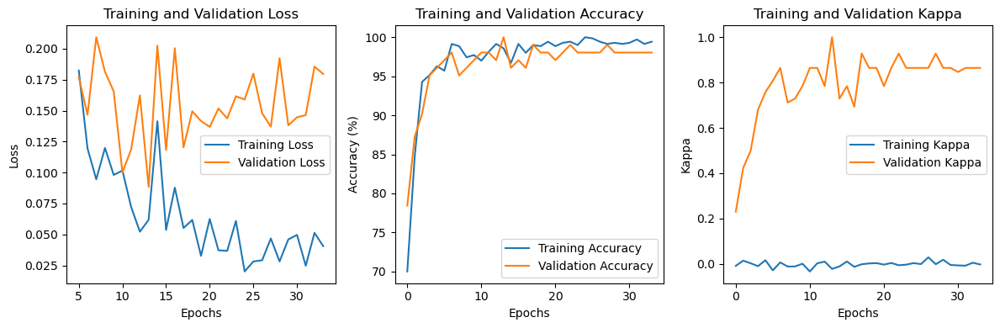

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  57 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6745851066979495, Training Accuracy: 63.142857142857146%, Avg. Validation Loss: 0.4318982788494655, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4709610939025879, Training Accuracy: 80.42857142857143%, Avg. Validation Loss: 0.3170745479209082, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34271688759326935, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.19034851023129054, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2529575983909043, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.2024462159190859, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [40/10000], Avg. Training Loss: 0.1107801792889156, Training Accuracy: 97.57142857142857%, Avg. Validation Loss: 0.11810397037437984, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.06320852549238638, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.12556726698364531, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.08699607383459806, Training Accuracy: 97.42857142857143%, Avg. Validation Loss: 0.1672112973673003, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.09872858471829783, Training Accuracy: 98.0%, Avg. Validation Loss: 0.13675119621413095, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.060049747497859324, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.17023346253803798, Validation Accuracy: 95.0980392156862

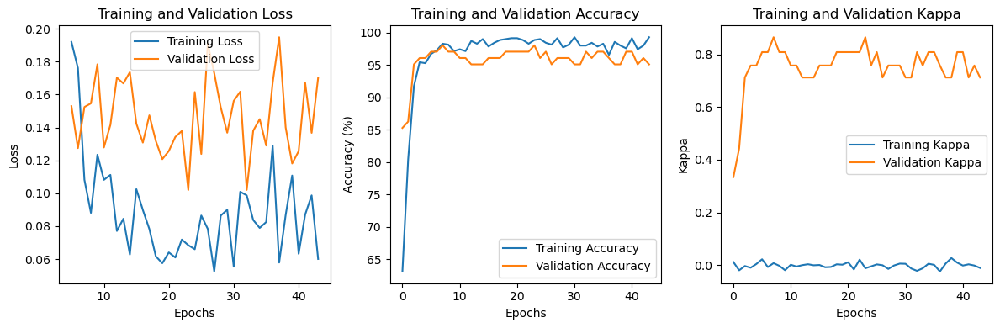

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8641975308641976
[[180   4]
 [  0  14]]
##################################### Iteration  58 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5656403574076566, Training Accuracy: 72.85714285714286%, Avg. Validation Loss: 0.5715073304516929, Validation Accuracy: 77.45098039215686%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3729292479428378, Training Accuracy: 87.57142857142857%, Avg. Validation Loss: 0.3778437674045563, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2743745737455108, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.33964160084724426, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24083937196569008, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.33475810076509205, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

Epoch [40/10000], Avg. Training Loss: 0.09359972195869143, Training Accuracy: 97.71428571428571%, Avg. Validation Loss: 0.1828864807529109, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.06757962026379326, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.2130414375237056, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0994369531981647, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.1953085692865508, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.09787196441638199, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.20058976539543696, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07508503328162161, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.1964117751589843, Validation Accuracy: 95.0980

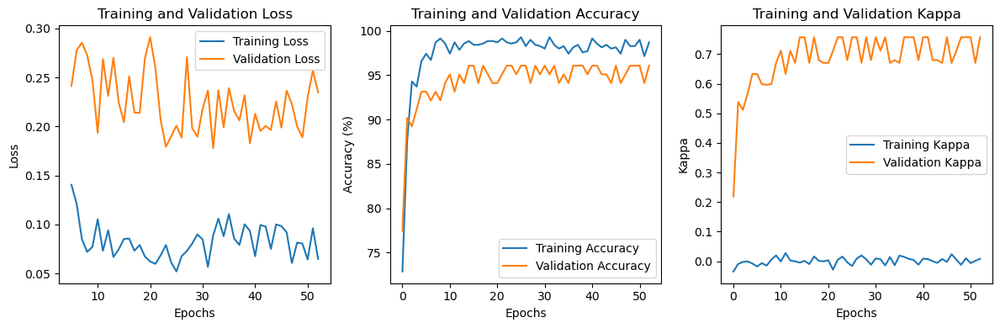

Accuracy of the network on the test set: 94.44444444444444 %, kappa: 0.6371209596801066
[[176   8]
 [  3  11]]
##################################### Iteration  59 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5309798311103474, Training Accuracy: 75.57142857142857%, Avg. Validation Loss: 0.6864426136016846, Validation Accuracy: 55.88235294117647%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3629129904914986, Training Accuracy: 89.71428571428571%, Avg. Validation Loss: 0.5071109916482653, Validation Accuracy: 84.31372549019608%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.28206872228871693, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.38255734954561504, Validation Accuracy: 85.29411764705883%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22759139300747352, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.27330638468265533, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [42/10000], Avg. Training Loss: 0.013014220262200317, Training Accuracy: 100.0%, Avg. Validation Loss: 0.14193330598728998, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.05793460209811614, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.11194375050919396, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.0601926976709034, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.130591981112957, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.02028932837261395, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.12059649559003967, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch 00041: reducing learning rate of group 0 to 1.0000e-08.
Epoch [46/10000], Avg. Training Loss: 0.04664090322330594, Training Accuracy: 99.42857142857143%, Avg. Validation Lo

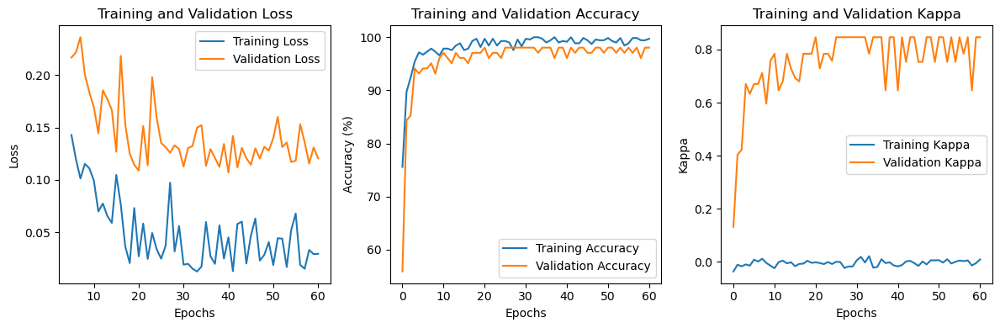

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  60 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5293225347995758, Training Accuracy: 77.28571428571429%, Avg. Validation Loss: 0.5187832031931195, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4084623144431548, Training Accuracy: 86.28571428571429%, Avg. Validation Loss: 0.422331588608878, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31202423437075183, Training Accuracy: 92.42857142857143%, Avg. Validation Loss: 0.3164813497236797, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22362963076342235, Training Accuracy: 96.85714285714286%, Avg. Validation Loss: 0.2532337648527963, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1

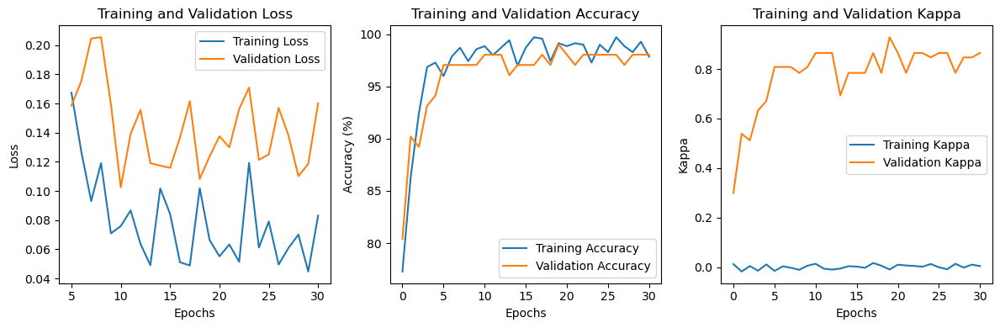

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.7115804806991988
[[179   5]
 [  3  11]]
##################################### Iteration  61 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7278126491741701, Training Accuracy: 57.142857142857146%, Avg. Validation Loss: 0.41275522112846375, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4931634671308778, Training Accuracy: 76.71428571428571%, Avg. Validation Loss: 0.2911331909043448, Validation Accuracy: 88.23529411764706%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34370891174132173, Training Accuracy: 91.0%, Avg. Validation Loss: 0.24555492401123047, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3033835511993278, Training Accuracy: 94.85714285714286%, Avg. Validation Loss: 0.12398038378783635, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.2435054856

Epoch [41/10000], Avg. Training Loss: 0.03517998668195849, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.10700711501496178, Validation Accuracy: 94.11764705882354%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.03750357281585986, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11530439183115959, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.040654107674278996, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.12115607836416789, Validation Accuracy: 94.11764705882354%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05461107149974189, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.13534715133053915, Validation Accuracy: 94.11764705882354%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.0888181567107412, Training Accuracy: 98.14285714285714%, Avg. Validation Loss: 0.10783840928758893, Validation Accuracy: 96

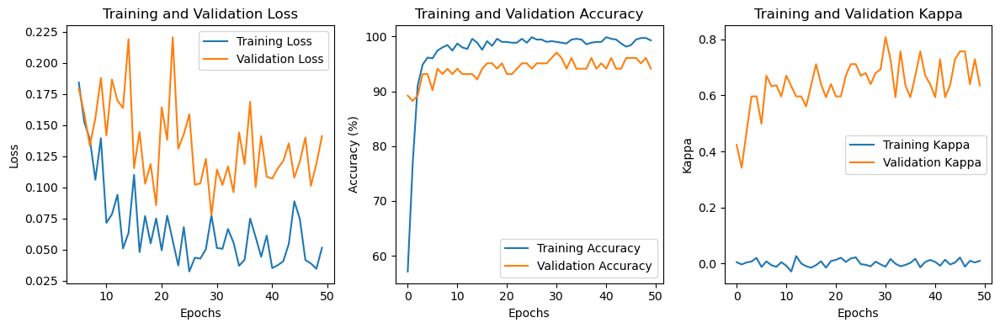

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8641975308641976
[[180   4]
 [  0  14]]
##################################### Iteration  62 #####################################
Epoch [1/10000], Avg. Training Loss: 0.623922432010824, Training Accuracy: 65.0%, Avg. Validation Loss: 0.5388774658952441, Validation Accuracy: 77.45098039215686%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.41394407573071396, Training Accuracy: 84.0%, Avg. Validation Loss: 0.4006502202578953, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.310544645244425, Training Accuracy: 90.71428571428571%, Avg. Validation Loss: 0.2617547107594354, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.20354347286576574, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.20460359752178192, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1484455567869273, Trainin

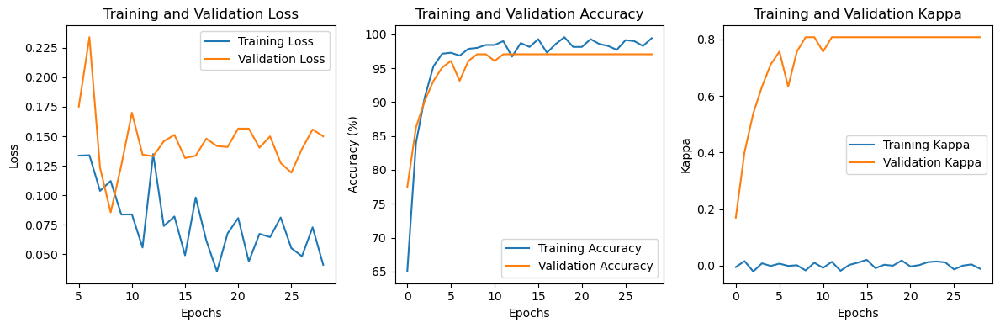

Accuracy of the network on the test set: 93.93939393939394 %, kappa: 0.6532399299474606
[[173  11]
 [  1  13]]
##################################### Iteration  63 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6800949370319193, Training Accuracy: 60.142857142857146%, Avg. Validation Loss: 0.4308908496584211, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4610724164681001, Training Accuracy: 80.0%, Avg. Validation Loss: 0.26760477891990114, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3445365500043739, Training Accuracy: 89.0%, Avg. Validation Loss: 0.19037481078079768, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24777873707088557, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.19462541490793228, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.25726493346420204, Tr

Epoch [40/10000], Avg. Training Loss: 0.07045575218613852, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.14247707703283854, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.05620586491105231, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.17896677872964314, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.057346334045922216, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.16345320216247014, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07945023269646546, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.16172853325094497, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07450913620943372, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.18504313166652406, Validation Accuracy: 9

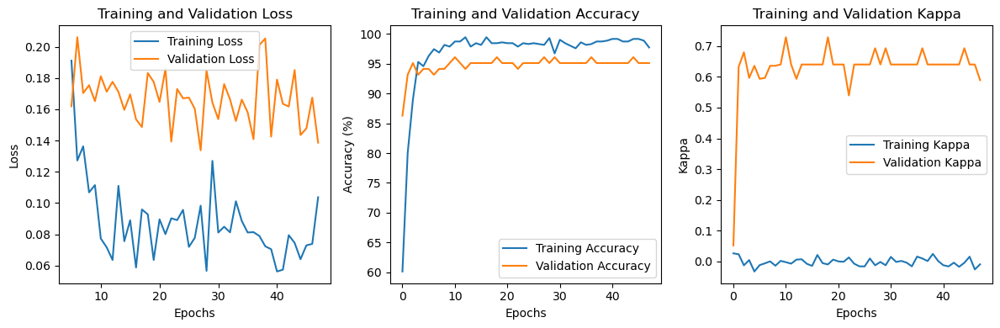

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.7867298578199052
[[183   1]
 [  4  10]]
##################################### Iteration  64 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7056833559816534, Training Accuracy: 53.0%, Avg. Validation Loss: 0.3942988472325461, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5539059930227019, Training Accuracy: 74.28571428571429%, Avg. Validation Loss: 0.2688279705388205, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.38494740291075275, Training Accuracy: 91.85714285714286%, Avg. Validation Loss: 0.3022457850830896, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30800550092350354, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.2395551119531904, Validation Accuracy: 90.19607843137256%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.264127129519

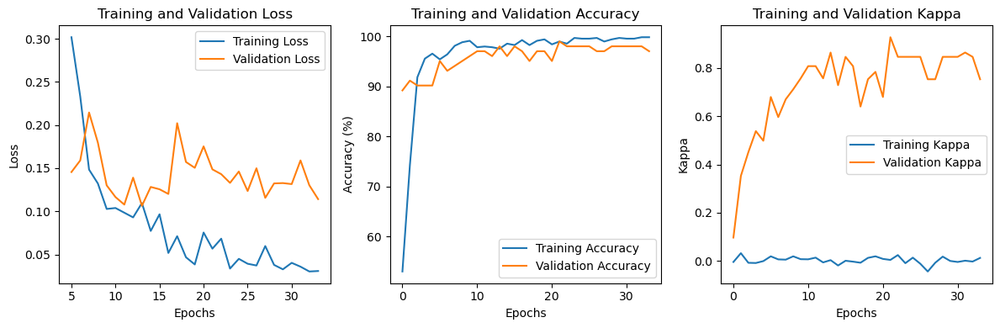

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.6852702225362063
[[178   6]
 [  3  11]]
##################################### Iteration  65 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7893251857974313, Training Accuracy: 43.285714285714285%, Avg. Validation Loss: 0.43578838450568064, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6264542585069482, Training Accuracy: 59.714285714285715%, Avg. Validation Loss: 0.26255052430289133, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.46064669164744293, Training Accuracy: 82.57142857142857%, Avg. Validation Loss: 0.21357613163334982, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3406564552675594, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.23726812856537954, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training L

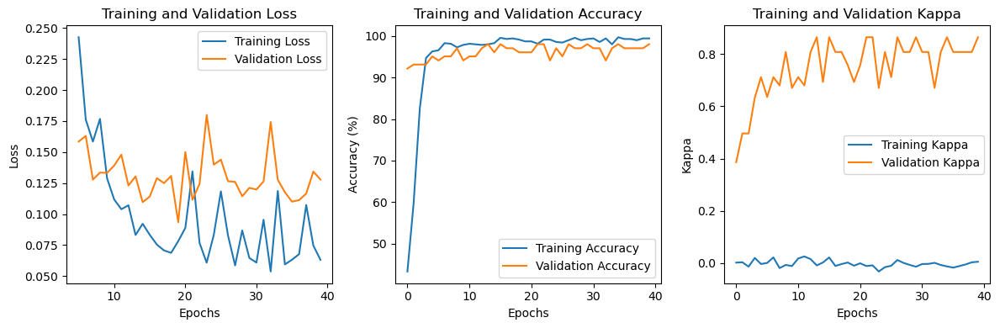

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8720379146919431
[[184   0]
 [  3  11]]
##################################### Iteration  66 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6277468746358698, Training Accuracy: 66.28571428571429%, Avg. Validation Loss: 0.5531948464257377, Validation Accuracy: 74.50980392156863%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4868243153799664, Training Accuracy: 80.71428571428571%, Avg. Validation Loss: 0.35049304578985485, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34944867105646565, Training Accuracy: 92.85714285714286%, Avg. Validation Loss: 0.33996395553861347, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29234963350675325, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.2678484906043325, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

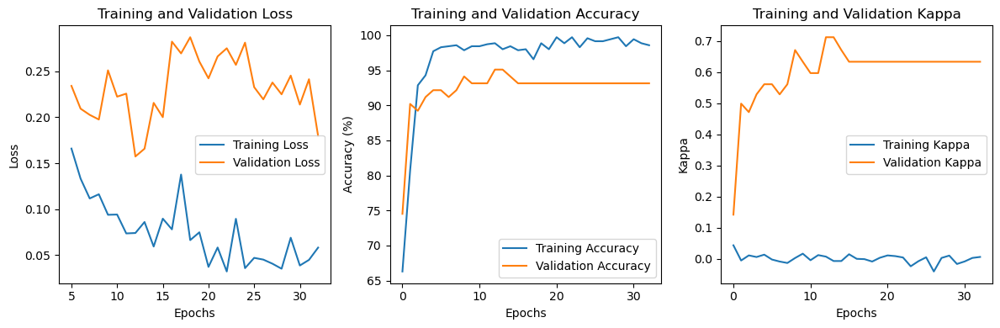

Accuracy of the network on the test set: 95.45454545454545 %, kappa: 0.7190160832544938
[[176   8]
 [  1  13]]
##################################### Iteration  67 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5823795043609359, Training Accuracy: 70.57142857142857%, Avg. Validation Loss: 0.4571335230554853, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.421533810144121, Training Accuracy: 84.42857142857143%, Avg. Validation Loss: 0.3249177208968571, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.31754058226943016, Training Accuracy: 93.0%, Avg. Validation Loss: 0.22140471850122725, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22866976667534222, Training Accuracy: 96.14285714285714%, Avg. Validation Loss: 0.17039466329983302, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.210586219518

Epoch [42/10000], Avg. Training Loss: 0.042859844323671, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.10244960657187871, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.04464026343670081, Training Accuracy: 99.0%, Avg. Validation Loss: 0.12705868376152857, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.07646559963045134, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.13334632239171437, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Early stopping due to no improvement in validation loss.


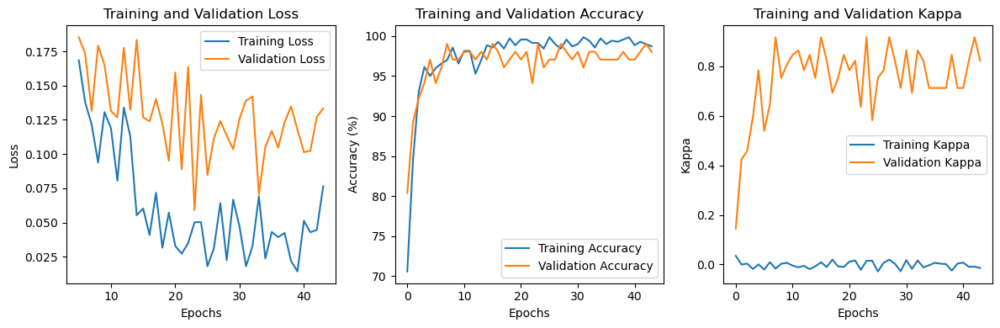

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8883878241262684
[[182   2]
 [  1  13]]
##################################### Iteration  68 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6368007632819089, Training Accuracy: 66.42857142857143%, Avg. Validation Loss: 0.47211259603500366, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4745319282466715, Training Accuracy: 84.28571428571429%, Avg. Validation Loss: 0.3074463563305991, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3482746190645478, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.3605235772473471, Validation Accuracy: 88.23529411764706%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30893706767396495, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.32189338547842844, Validation Accuracy: 88.23529411764706%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

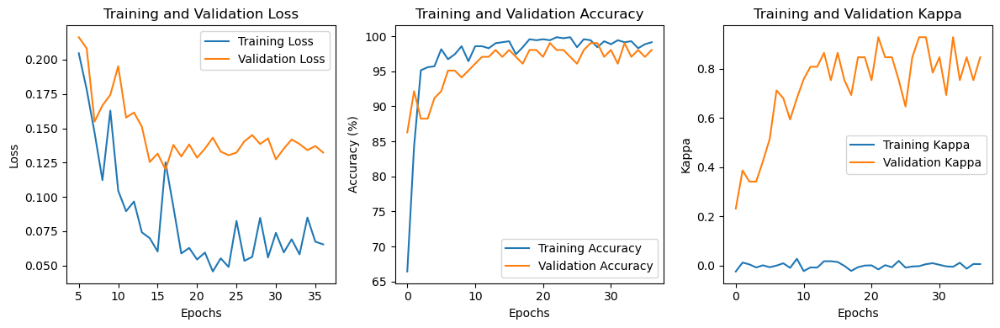

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9278951201747997
[[182   2]
 [  0  14]]
##################################### Iteration  69 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7409268136728894, Training Accuracy: 51.57142857142857%, Avg. Validation Loss: 0.3095533081463405, Validation Accuracy: 95.09803921568627%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5861485763029619, Training Accuracy: 73.85714285714286%, Avg. Validation Loss: 0.2508075769458498, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3978846642104062, Training Accuracy: 90.14285714285714%, Avg. Validation Loss: 0.15653469200645173, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2906749333170327, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.18221823232514517, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

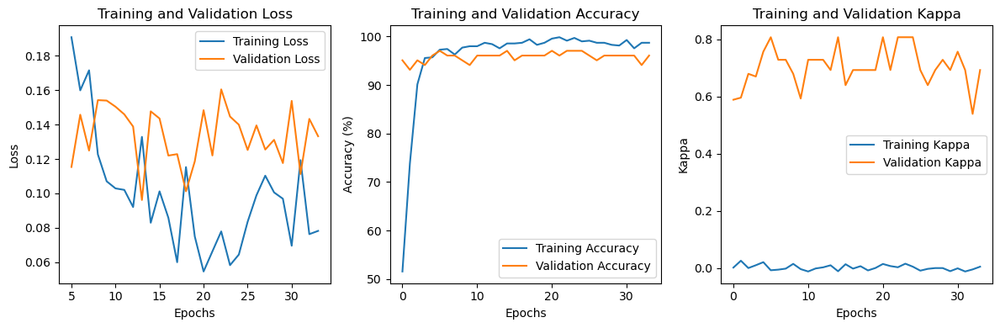

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  70 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5870105996727943, Training Accuracy: 70.0%, Avg. Validation Loss: 0.4913609155586788, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.39810188250108197, Training Accuracy: 87.42857142857143%, Avg. Validation Loss: 0.27907730851854595, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.30733003467321396, Training Accuracy: 92.85714285714286%, Avg. Validation Loss: 0.21859278636319296, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2488591433926062, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.26644020634038107, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.19534936

Epoch [40/10000], Avg. Training Loss: 0.0645911931483583, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.18288734980991908, Validation Accuracy: 94.11764705882354%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.07622446128251878, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.18568855204752513, Validation Accuracy: 94.11764705882354%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07704166068949482, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.2029812282749585, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.07478319845077666, Training Accuracy: 99.0%, Avg. Validation Loss: 0.19251803415162222, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.0768425368111242, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.1677316650748253, Validation Accuracy: 96.07843137254902%,

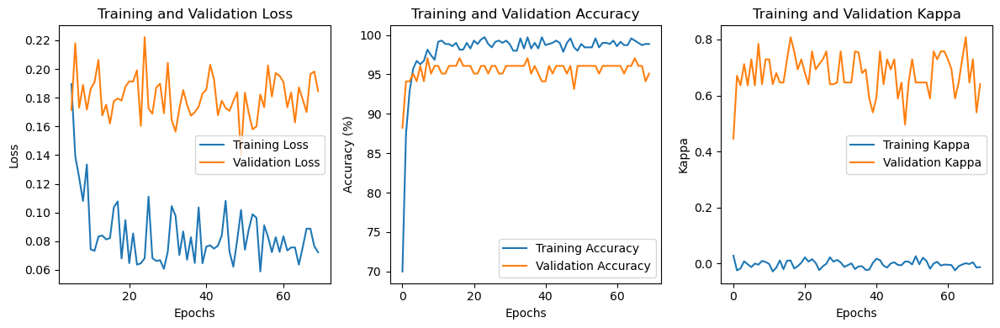

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.755210173083716
[[179   5]
 [  2  12]]
##################################### Iteration  71 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8909409201957963, Training Accuracy: 47.142857142857146%, Avg. Validation Loss: 0.33833828781332287, Validation Accuracy: 91.17647058823529%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6308388974178921, Training Accuracy: 68.14285714285714%, Avg. Validation Loss: 0.27868376140083584, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4344717944887551, Training Accuracy: 89.0%, Avg. Validation Loss: 0.25928687517132076, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3658385717056014, Training Accuracy: 93.57142857142857%, Avg. Validation Loss: 0.2838604950479099, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.3038063465

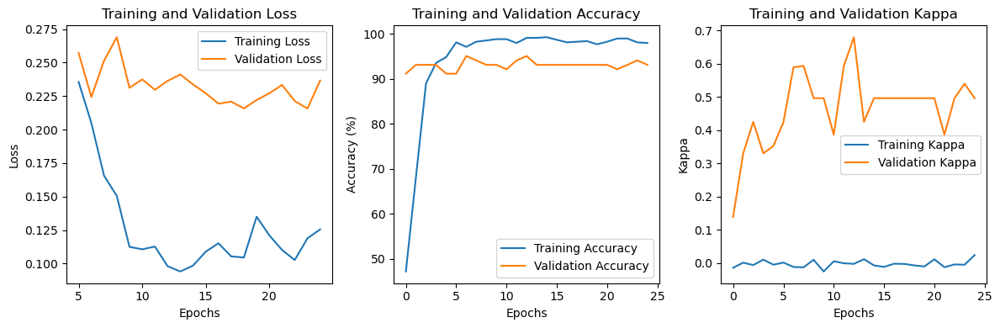

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7531172069825437
[[182   2]
 [  4  10]]
##################################### Iteration  72 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7188366069035097, Training Accuracy: 50.57142857142857%, Avg. Validation Loss: 0.41937875747680664, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.57611933960156, Training Accuracy: 70.14285714285714%, Avg. Validation Loss: 0.30512905546597074, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.42749125307256525, Training Accuracy: 87.71428571428571%, Avg. Validation Loss: 0.26056053595883505, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.35370294004678726, Training Accuracy: 94.0%, Avg. Validation Loss: 0.24542119673320226, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.318555802

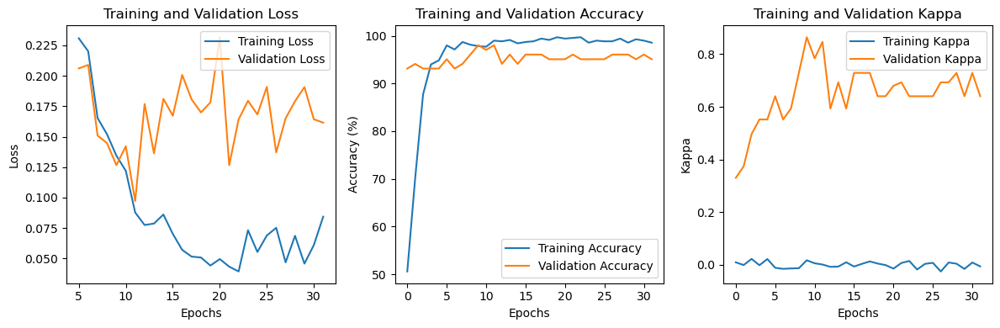

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  73 #####################################
Epoch [1/10000], Avg. Training Loss: 0.836987628178163, Training Accuracy: 43.42857142857143%, Avg. Validation Loss: 0.30402823856898714, Validation Accuracy: 94.11764705882354%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6000714871016416, Training Accuracy: 69.57142857142857%, Avg. Validation Loss: 0.21720691131693975, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4764983491464095, Training Accuracy: 85.0%, Avg. Validation Loss: 0.35367487158094135, Validation Accuracy: 82.3529411764706%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.41058591854843224, Training Accuracy: 93.71428571428571%, Avg. Validation Loss: 0.15990328469446727, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.3119976896

Epoch [41/10000], Avg. Training Loss: 0.06963473291728985, Training Accuracy: 99.0%, Avg. Validation Loss: 0.1491478042943137, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.08786571542309089, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.11901955945151192, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.06689890677278693, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.0967499203979969, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07036937756294553, Training Accuracy: 99.0%, Avg. Validation Loss: 0.15032186252730234, Validation Accuracy: 96.07843137254902%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.053532933689315214, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.11137915828398295, Validation Accuracy: 98.03921568627452%, lr: 1.000

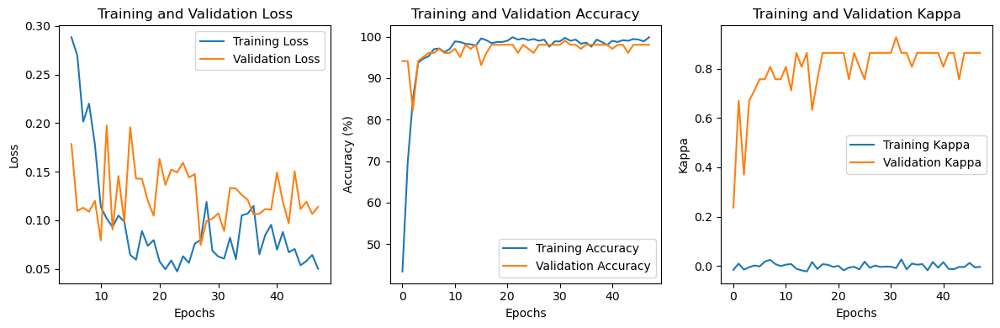

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  74 #####################################
Epoch [1/10000], Avg. Training Loss: 0.510846465148709, Training Accuracy: 75.85714285714286%, Avg. Validation Loss: 0.538157548223223, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3538878312842412, Training Accuracy: 86.57142857142857%, Avg. Validation Loss: 0.39492455976349966, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2743735679171302, Training Accuracy: 92.71428571428571%, Avg. Validation Loss: 0.3038049169949123, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2088468179784038, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.2215637287923268, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1

Epoch [42/10000], Avg. Training Loss: 0.04379648217846724, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.1123920955828258, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.09115665672685612, Training Accuracy: 97.85714285714286%, Avg. Validation Loss: 0.06853954866528511, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.05236892888999798, Training Accuracy: 99.0%, Avg. Validation Loss: 0.10424392883266721, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.055417081150649625, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.12029293711696352, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [46/10000], Avg. Training Loss: 0.049357756675983015, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.09698561312896865, Validation Accuracy: 100.0%, lr: 1.0000000000000004e-08
Early stopping 

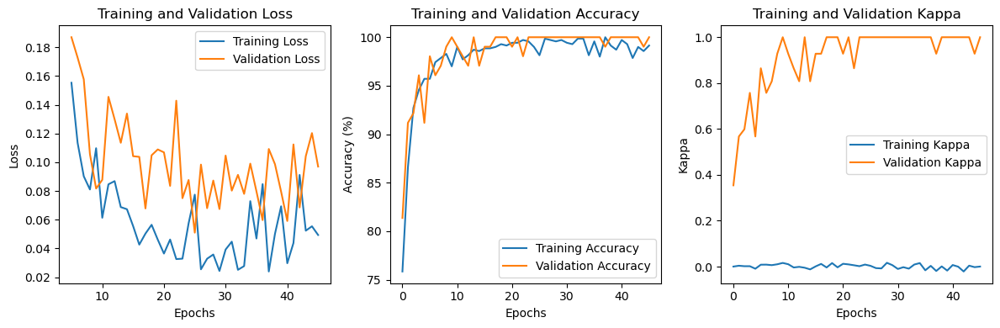

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8139797068771139
[[181   3]
 [  2  12]]
##################################### Iteration  75 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5851062942634929, Training Accuracy: 70.14285714285714%, Avg. Validation Loss: 0.5019520648888179, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.39700405130332167, Training Accuracy: 85.71428571428571%, Avg. Validation Loss: 0.2844986894301006, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.29754995148290286, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.20769972779921123, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.21403113735670393, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.19957717933825084, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

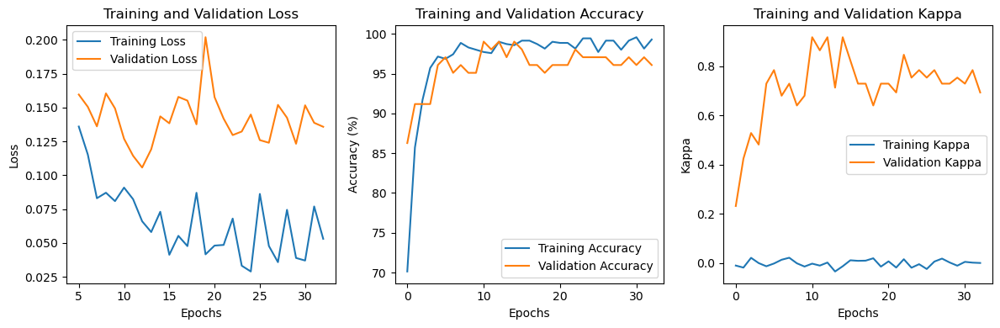

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8350549816727757
[[179   5]
 [  0  14]]
##################################### Iteration  76 #####################################
Epoch [1/10000], Avg. Training Loss: 0.654870633374561, Training Accuracy: 59.42857142857143%, Avg. Validation Loss: 0.4873525585447039, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5173547870733521, Training Accuracy: 78.28571428571429%, Avg. Validation Loss: 0.29387382737227846, Validation Accuracy: 97.05882352941177%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3840565952387723, Training Accuracy: 91.85714285714286%, Avg. Validation Loss: 0.23227195015975408, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2956091399219903, Training Accuracy: 95.85714285714286%, Avg. Validation Loss: 0.25195244593279703, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

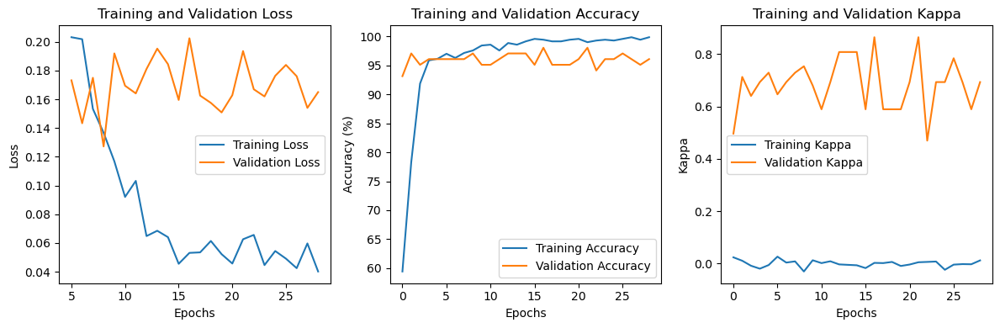

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  77 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5462245338342406, Training Accuracy: 73.0%, Avg. Validation Loss: 0.6189095335347312, Validation Accuracy: 70.58823529411765%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3976608853448521, Training Accuracy: 86.0%, Avg. Validation Loss: 0.38891238825661795, Validation Accuracy: 85.29411764705883%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2871013669805093, Training Accuracy: 94.0%, Avg. Validation Loss: 0.3390203246048519, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23136036504398694, Training Accuracy: 94.71428571428571%, Avg. Validation Loss: 0.27592646862779346, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.17261655239219015, Training Accuracy:

Epoch [40/10000], Avg. Training Loss: 0.062221853909167374, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.18213269167712756, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.05880773397670551, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.19280155641692026, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.07117382432757453, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.13658329844474792, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.08642870378257199, Training Accuracy: 98.0%, Avg. Validation Loss: 0.1734238075358527, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.036100830205462196, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.20809014035122736, Validation Accuracy: 95.09803921568

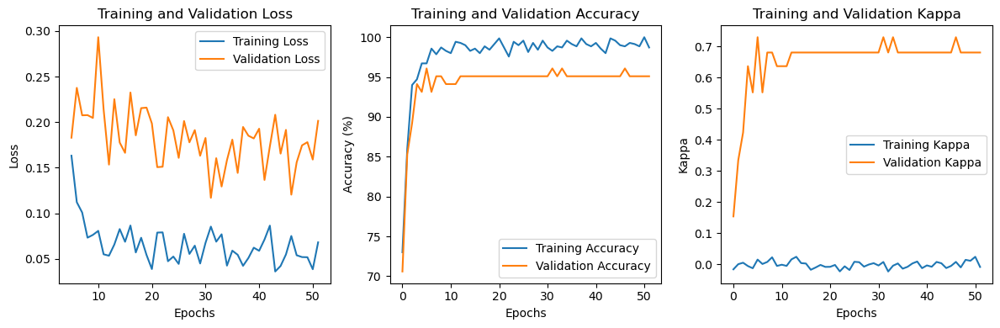

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8251501236312258
[[180   4]
 [  1  13]]
##################################### Iteration  78 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8283763419498097, Training Accuracy: 53.142857142857146%, Avg. Validation Loss: 0.2630028362785067, Validation Accuracy: 94.11764705882354%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5737526443871585, Training Accuracy: 75.28571428571429%, Avg. Validation Loss: 0.222790461565767, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3935443650592457, Training Accuracy: 90.85714285714286%, Avg. Validation Loss: 0.18037121317216329, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.30956177379597316, Training Accuracy: 95.14285714285714%, Avg. Validation Loss: 0.15286579728126526, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

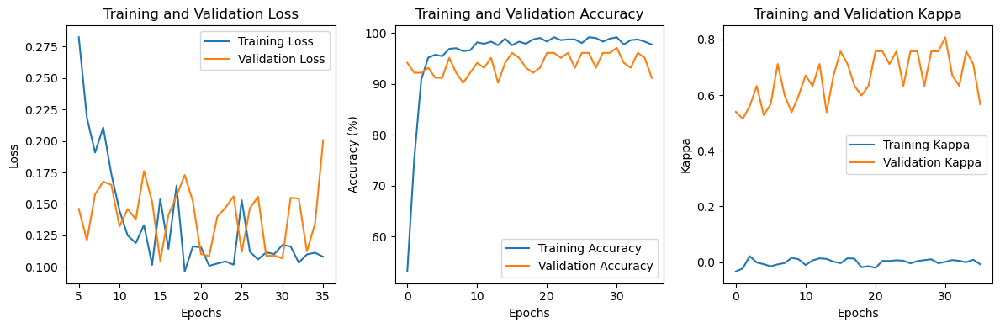

Accuracy of the network on the test set: 92.42424242424242 %, kappa: 0.6143858737990132
[[169  15]
 [  0  14]]
##################################### Iteration  79 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5922264321283861, Training Accuracy: 68.0%, Avg. Validation Loss: 0.5669260493346623, Validation Accuracy: 77.45098039215686%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.45087510821494187, Training Accuracy: 84.0%, Avg. Validation Loss: 0.3757396936416626, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3368490185927261, Training Accuracy: 91.42857142857143%, Avg. Validation Loss: 0.24471178225108556, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2956247234886343, Training Accuracy: 92.85714285714286%, Avg. Validation Loss: 0.26338926596300943, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.22443377362056213, Trai

Epoch [41/10000], Avg. Training Loss: 0.05098694795742631, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.11088994464703969, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.0383704220241105, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.11525048209088189, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.04508906422944909, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.13071948289871216, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.045823965750804004, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.12072599253484181, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [45/10000], Avg. Training Loss: 0.031455930385907944, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.12742981421095984, Validation Accuracy: 9

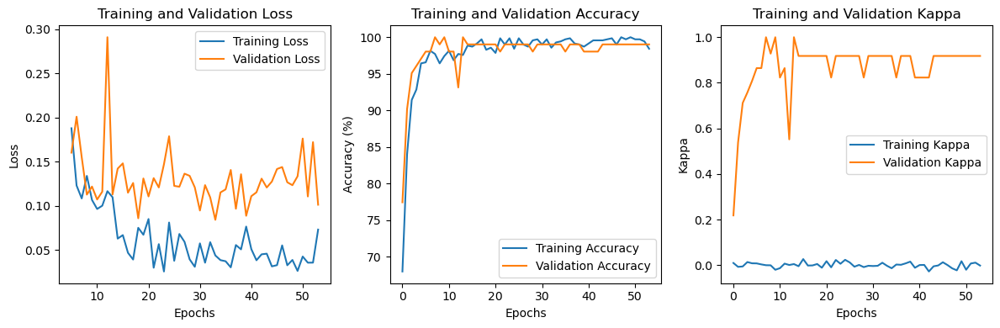

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  80 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6675897267731753, Training Accuracy: 60.57142857142857%, Avg. Validation Loss: 0.48727868284497944, Validation Accuracy: 83.33333333333333%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4931255010041324, Training Accuracy: 80.14285714285714%, Avg. Validation Loss: 0.3226150742598942, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3397351693023335, Training Accuracy: 91.57142857142857%, Avg. Validation Loss: 0.1792509491954531, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27885753593661566, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.12593519261905126, Validation Accuracy: 97.05882352941177%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

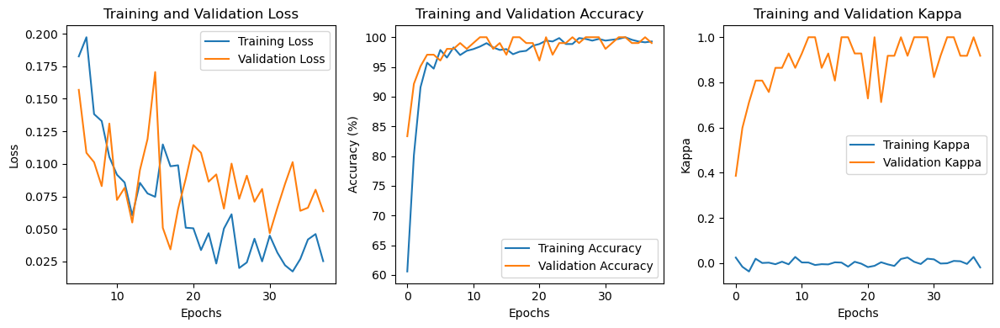

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9177057356608479
[[184   0]
 [  2  12]]
##################################### Iteration  81 #####################################
Epoch [1/10000], Avg. Training Loss: 0.8078274767507206, Training Accuracy: 50.0%, Avg. Validation Loss: 0.3372809035437448, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.6157255633310839, Training Accuracy: 67.28571428571429%, Avg. Validation Loss: 0.2228906186563628, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.45083327997814526, Training Accuracy: 87.57142857142857%, Avg. Validation Loss: 0.19790637493133545, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.33010634644465014, Training Accuracy: 94.0%, Avg. Validation Loss: 0.15376020967960358, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.3034818629649552, Trai

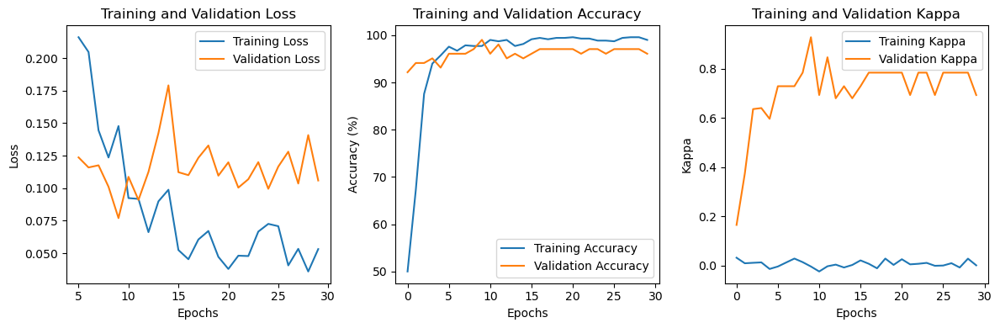

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  82 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6463768780231476, Training Accuracy: 62.285714285714285%, Avg. Validation Loss: 0.4086648736681257, Validation Accuracy: 90.19607843137256%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.46229063042185525, Training Accuracy: 79.28571428571429%, Avg. Validation Loss: 0.28259322685854776, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3644129698249427, Training Accuracy: 89.28571428571429%, Avg. Validation Loss: 0.26455906672137125, Validation Accuracy: 91.17647058823529%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25687287222932687, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.1509086713194847, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

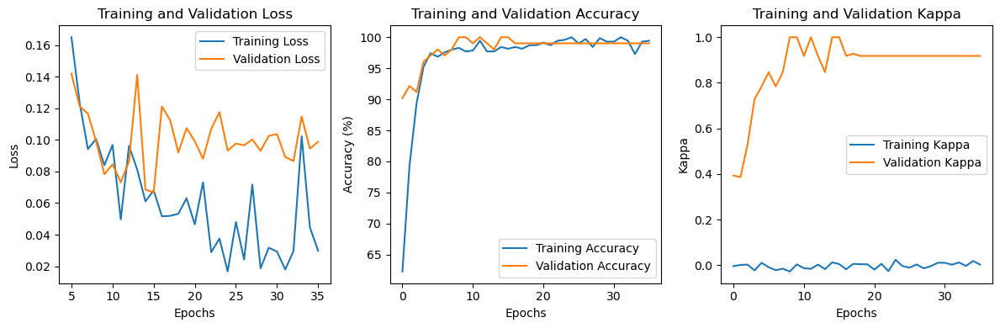

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  83 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5508041449568488, Training Accuracy: 79.71428571428571%, Avg. Validation Loss: 0.5109239263193948, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.43762927231463516, Training Accuracy: 91.28571428571429%, Avg. Validation Loss: 0.4248830888952528, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3522723161361434, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.35022842032568796, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29431131515990605, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.289345668894904, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.

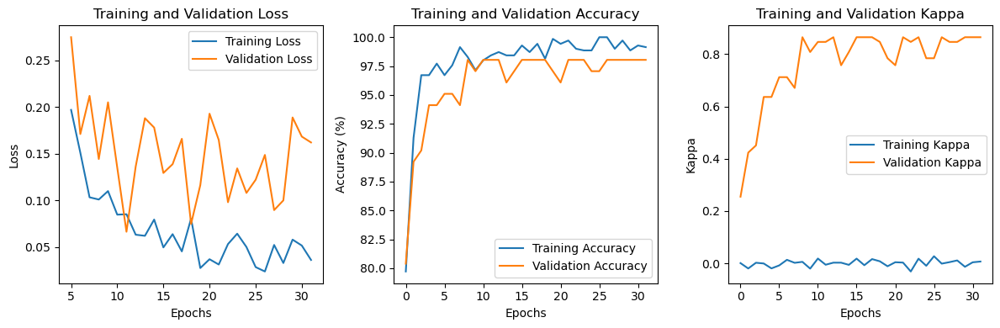

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6925465838509317
[[180   4]
 [  4  10]]
##################################### Iteration  84 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7938741743564606, Training Accuracy: 50.142857142857146%, Avg. Validation Loss: 0.3372798562049866, Validation Accuracy: 92.15686274509804%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5532090345566923, Training Accuracy: 71.71428571428571%, Avg. Validation Loss: 0.2475158487047468, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.36899834363297984, Training Accuracy: 90.42857142857143%, Avg. Validation Loss: 0.18489744194916316, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28142457286065276, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.16308381195579255, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

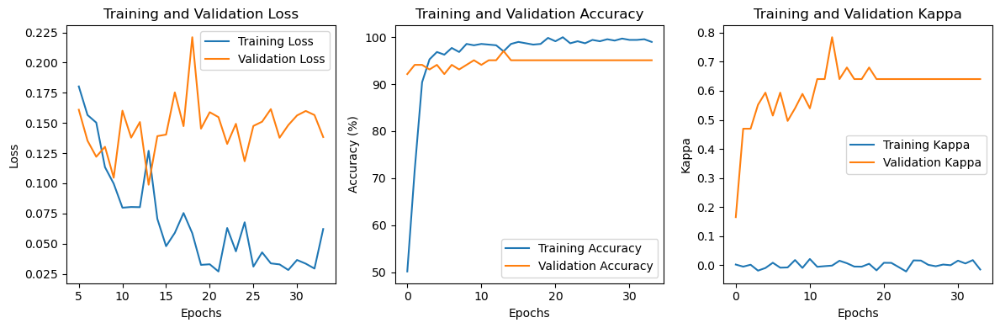

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8462732919254659
[[182   2]
 [  2  12]]
##################################### Iteration  85 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6566121896559541, Training Accuracy: 61.142857142857146%, Avg. Validation Loss: 0.49413480503218515, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.46553585678339005, Training Accuracy: 84.0%, Avg. Validation Loss: 0.3338512054511479, Validation Accuracy: 86.27450980392157%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3623407022519545, Training Accuracy: 93.0%, Avg. Validation Loss: 0.23900320274489267, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.3095847595144402, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.224223222051348, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.25482781062071974, Trai

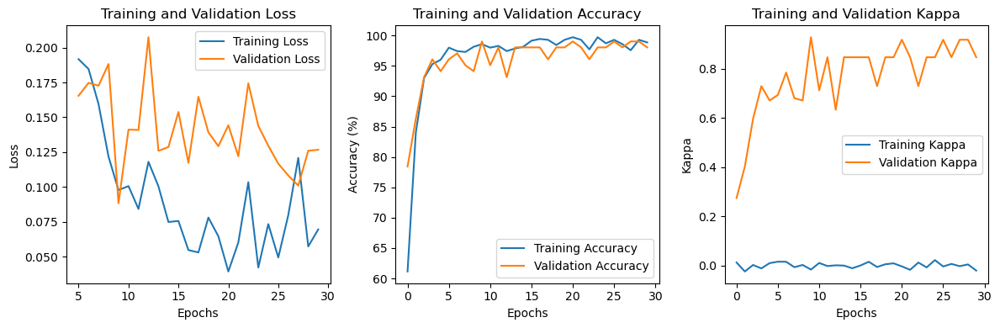

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9177057356608479
[[184   0]
 [  2  12]]
##################################### Iteration  86 #####################################
Epoch [1/10000], Avg. Training Loss: 0.677487538619475, Training Accuracy: 57.57142857142857%, Avg. Validation Loss: 0.653036858354296, Validation Accuracy: 59.80392156862745%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5525841801003977, Training Accuracy: 77.28571428571429%, Avg. Validation Loss: 0.40689446244921, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.41128239780664444, Training Accuracy: 87.71428571428571%, Avg. Validation Loss: 0.28519552520343233, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28891694139350543, Training Accuracy: 95.0%, Avg. Validation Loss: 0.2614686020783016, Validation Accuracy: 93.13725490196079%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.23350822078910

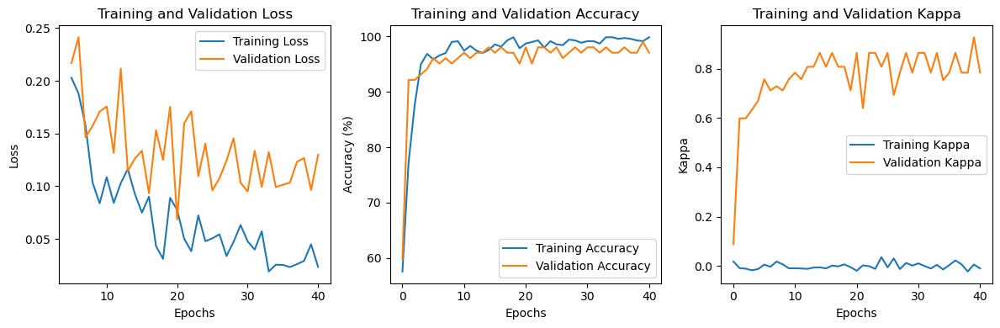

Accuracy of the network on the test set: 97.47474747474747 %, kappa: 0.8012846246487355
[[182   2]
 [  3  11]]
##################################### Iteration  87 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6986035961996425, Training Accuracy: 55.285714285714285%, Avg. Validation Loss: 0.4036367578165872, Validation Accuracy: 88.23529411764706%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5475623953071508, Training Accuracy: 76.71428571428571%, Avg. Validation Loss: 0.21565828791686467, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3555888574231755, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.2189671163048063, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.29938219995661214, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.22641604500157492, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss

Epoch [40/10000], Avg. Training Loss: 0.07547638125040314, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.13006828352808952, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.09960507457567887, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.1399460110281195, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.12251712974499572, Training Accuracy: 98.0%, Avg. Validation Loss: 0.1362157054245472, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.09467213846404444, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.15480560436844826, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.0762755602428859, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.15553820771830423, Validation Accuracy: 97.05882352941177%

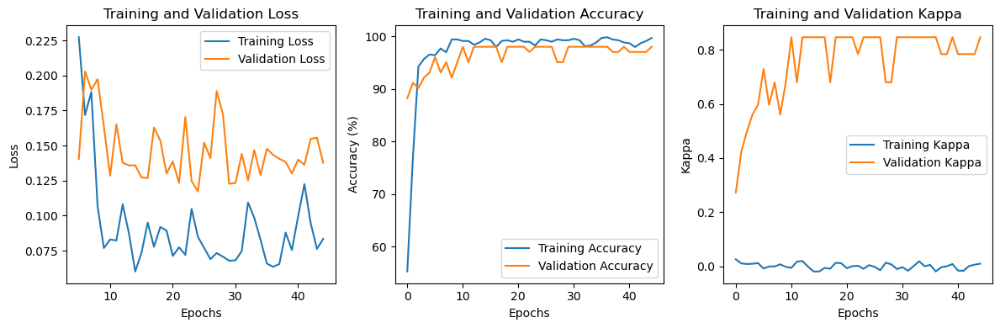

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8354114713216958
[[183   1]
 [  3  11]]
##################################### Iteration  88 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5888743278655139, Training Accuracy: 68.85714285714286%, Avg. Validation Loss: 0.5341258687632424, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4427035322243517, Training Accuracy: 84.57142857142857%, Avg. Validation Loss: 0.36163883549826487, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.32484280080957845, Training Accuracy: 94.28571428571429%, Avg. Validation Loss: 0.323975784437997, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.27761162986809557, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.26872381780828747, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

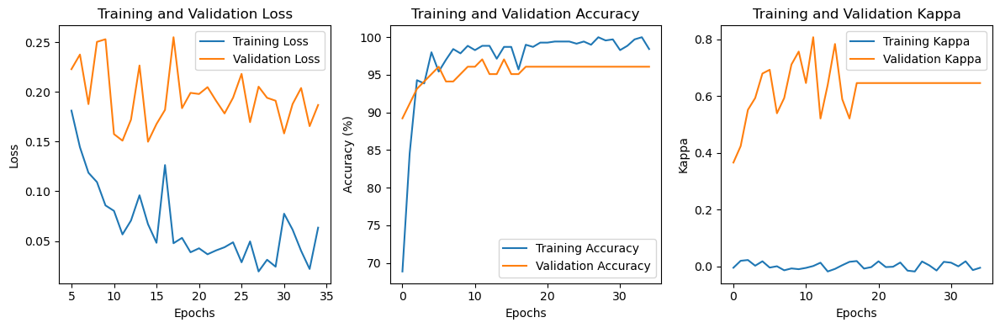

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8883878241262684
[[182   2]
 [  1  13]]
##################################### Iteration  89 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7449603473598306, Training Accuracy: 56.857142857142854%, Avg. Validation Loss: 0.3724208176136017, Validation Accuracy: 86.27450980392157%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5041299828074195, Training Accuracy: 77.57142857142857%, Avg. Validation Loss: 0.2551020234823227, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3488482467152856, Training Accuracy: 91.85714285714286%, Avg. Validation Loss: 0.21623921713658742, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.26634404774416576, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.178236862378461, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

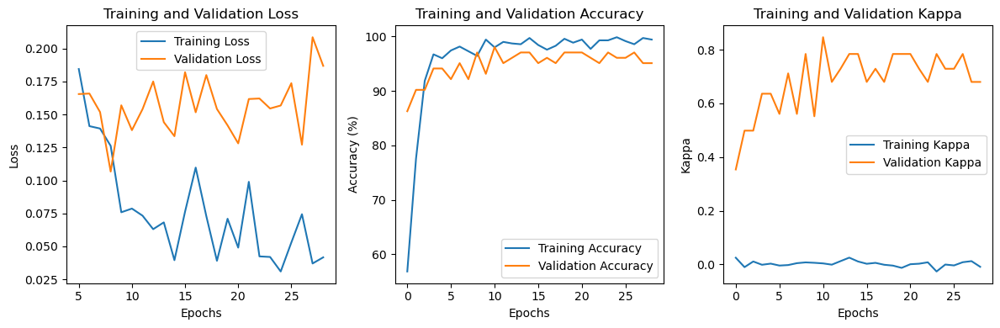

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.769076974341886
[[178   6]
 [  1  13]]
##################################### Iteration  90 #####################################
Epoch [1/10000], Avg. Training Loss: 0.49628653445027093, Training Accuracy: 77.0%, Avg. Validation Loss: 0.6833475487572807, Validation Accuracy: 58.8235294117647%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.36353800919922913, Training Accuracy: 86.85714285714286%, Avg. Validation Loss: 0.46294593811035156, Validation Accuracy: 85.29411764705883%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2777208953418515, Training Accuracy: 94.14285714285714%, Avg. Validation Loss: 0.3835923416273935, Validation Accuracy: 89.2156862745098%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.23230718076229095, Training Accuracy: 95.57142857142857%, Avg. Validation Loss: 0.33654654238905224, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.17404324950

Epoch [41/10000], Avg. Training Loss: 0.07290185740302232, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.1427369170955249, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04624193174425851, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.13709974076066697, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.03513290057890117, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.15457254541771753, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.03818922390399331, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.14185922273567744, Validation Accuracy: 97.05882352941177%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


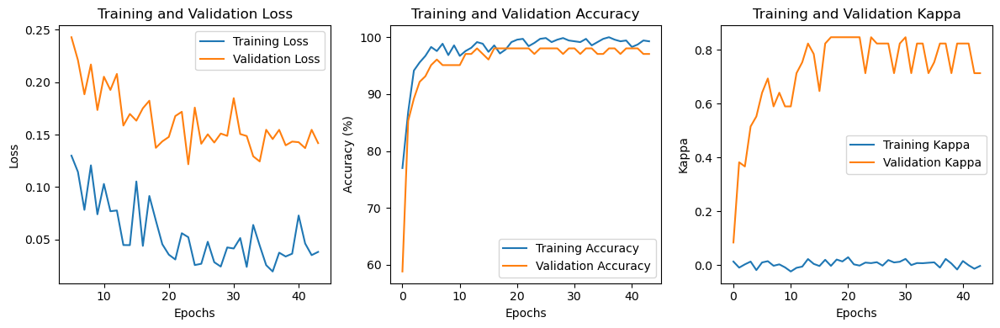

Accuracy of the network on the test set: 94.94949494949495 %, kappa: 0.6604938271604939
[[177   7]
 [  3  11]]
##################################### Iteration  91 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6194812635129149, Training Accuracy: 67.57142857142857%, Avg. Validation Loss: 0.4068753251007625, Validation Accuracy: 80.3921568627451%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4522983357310295, Training Accuracy: 86.0%, Avg. Validation Loss: 0.1891301167862756, Validation Accuracy: 92.15686274509804%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3226226679980755, Training Accuracy: 95.28571428571429%, Avg. Validation Loss: 0.2633366031306131, Validation Accuracy: 90.19607843137256%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.28487191078337754, Training Accuracy: 95.42857142857143%, Avg. Validation Loss: 0.20586328421320235, Validation Accuracy: 92.15686274509804%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.255597061054

Epoch [41/10000], Avg. Training Loss: 0.037060146601024, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.12397202742951256, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04501559839329936, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.1067312668476786, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


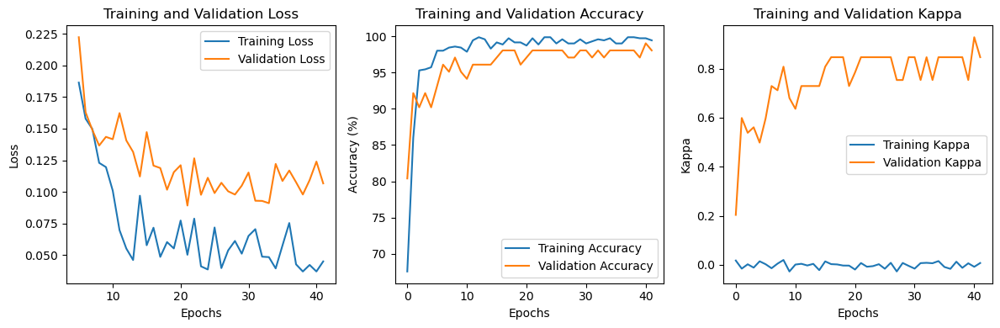

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8807707747892413
[[183   1]
 [  2  12]]
##################################### Iteration  92 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6260788996111263, Training Accuracy: 64.28571428571429%, Avg. Validation Loss: 0.42668022428240093, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4880979304963892, Training Accuracy: 76.57142857142857%, Avg. Validation Loss: 0.30012035369873047, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3346038044176318, Training Accuracy: 90.57142857142857%, Avg. Validation Loss: 0.2733437440225056, Validation Accuracy: 87.25490196078431%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2326894090934233, Training Accuracy: 96.42857142857143%, Avg. Validation Loss: 0.23870802564280375, Validation Accuracy: 91.17647058823529%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 

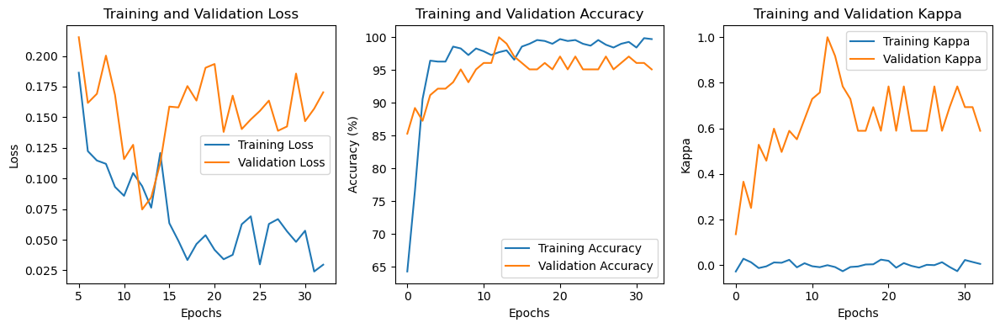

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9231366459627329
[[183   1]
 [  1  13]]
##################################### Iteration  93 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6625023274259134, Training Accuracy: 61.42857142857143%, Avg. Validation Loss: 0.4333846228463309, Validation Accuracy: 85.29411764705883%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.49867869778112933, Training Accuracy: 78.57142857142857%, Avg. Validation Loss: 0.21341608145407268, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3598389168354598, Training Accuracy: 92.57142857142857%, Avg. Validation Loss: 0.19369703850575856, Validation Accuracy: 92.15686274509804%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.25964302772825415, Training Accuracy: 96.57142857142857%, Avg. Validation Loss: 0.19493257999420166, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Los

Epoch [41/10000], Avg. Training Loss: 0.038840542335740545, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.09613189207656044, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.04751879937777465, Training Accuracy: 99.28571428571429%, Avg. Validation Loss: 0.09138273873499461, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000004e-08
Early stopping due to no improvement in validation loss.


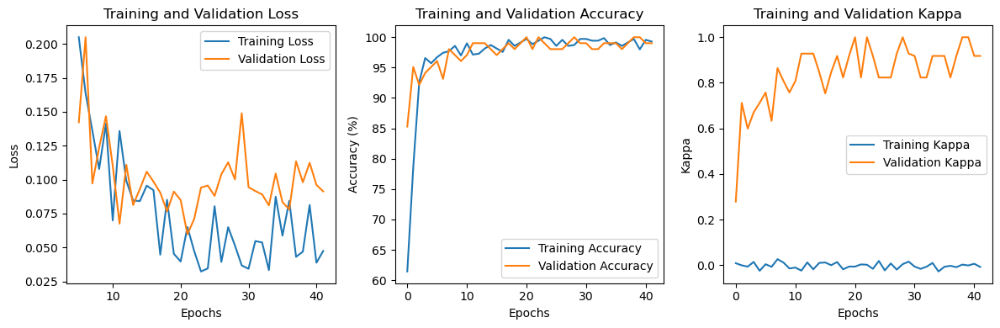

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.7694099378881988
[[181   3]
 [  3  11]]
##################################### Iteration  94 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6379725770516829, Training Accuracy: 63.142857142857146%, Avg. Validation Loss: 0.5689578056335449, Validation Accuracy: 81.37254901960785%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.465830995277925, Training Accuracy: 79.71428571428571%, Avg. Validation Loss: 0.39492795722825186, Validation Accuracy: 91.17647058823529%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3277880996465683, Training Accuracy: 90.57142857142857%, Avg. Validation Loss: 0.3019734876496451, Validation Accuracy: 96.07843137254902%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22407165068117055, Training Accuracy: 96.71428571428571%, Avg. Validation Loss: 0.25816671550273895, Validation Accuracy: 94.11764705882354%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [42/10000], Avg. Training Loss: 0.02055845771577548, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.0955277532339096, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.09651753638172522, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.0663549963917051, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.05053320219105279, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.09032050307307925, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.09934679147342897, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.07517582231334277, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Early stopping due to no improvement in validation loss.


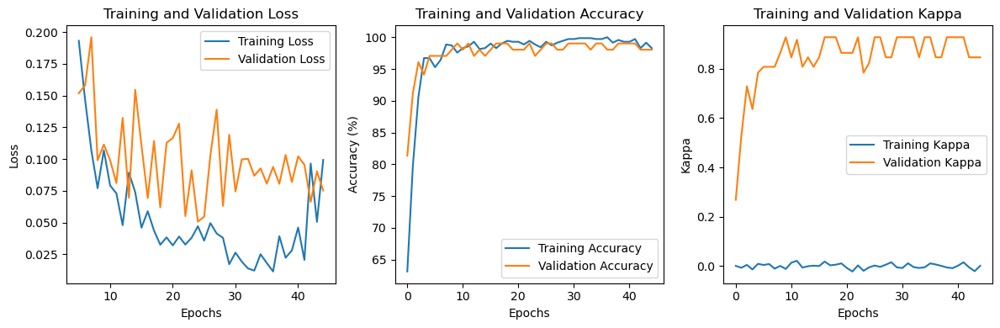

Accuracy of the network on the test set: 96.96969696969697 %, kappa: 0.8075178224238496
[[178   6]
 [  0  14]]
##################################### Iteration  95 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7752991169691086, Training Accuracy: 43.57142857142857%, Avg. Validation Loss: 0.3620999412877219, Validation Accuracy: 93.13725490196079%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5748610848730261, Training Accuracy: 70.14285714285714%, Avg. Validation Loss: 0.24289033455508097, Validation Accuracy: 95.09803921568627%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.4984085370193828, Training Accuracy: 85.14285714285714%, Avg. Validation Loss: 0.1811137625149318, Validation Accuracy: 97.05882352941177%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.4155604913830757, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.2107654426779066, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [42/10000], Avg. Training Loss: 0.10490335126153448, Training Accuracy: 98.0%, Avg. Validation Loss: 0.07801957055926323, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [43/10000], Avg. Training Loss: 0.044079151724211195, Training Accuracy: 100.0%, Avg. Validation Loss: 0.05724152523492064, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [44/10000], Avg. Training Loss: 0.04238387984646992, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.0677980546440397, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [45/10000], Avg. Training Loss: 0.12165384798903357, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.04478997497686318, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-07
Epoch [46/10000], Avg. Training Loss: 0.08175373623486269, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.06559346829141889, Validation Accuracy: 99.01960784313725%, lr: 1.0

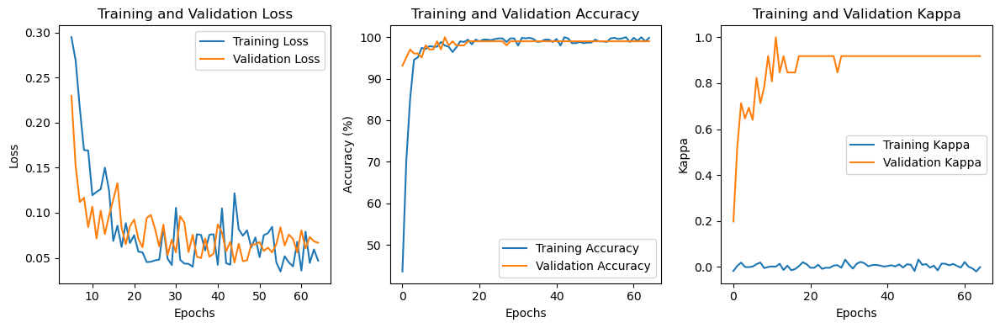

Accuracy of the network on the test set: 95.95959595959596 %, kappa: 0.6708229426433916
[[181   3]
 [  5   9]]
##################################### Iteration  96 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7172115370631218, Training Accuracy: 55.285714285714285%, Avg. Validation Loss: 0.5015897580555507, Validation Accuracy: 78.43137254901961%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5016975626349449, Training Accuracy: 79.57142857142857%, Avg. Validation Loss: 0.26005623170307707, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.34997875040227716, Training Accuracy: 90.85714285714286%, Avg. Validation Loss: 0.16867599955626897, Validation Accuracy: 95.09803921568627%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.22414125976237384, Training Accuracy: 96.85714285714286%, Avg. Validation Loss: 0.14017646866185324, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Lo

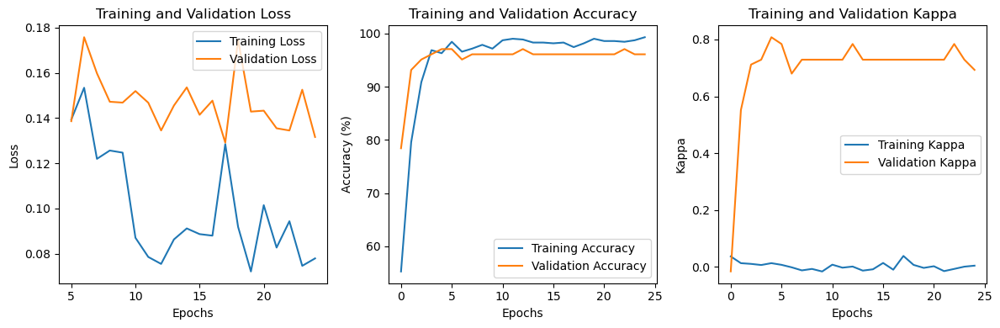

Accuracy of the network on the test set: 98.98989898989899 %, kappa: 0.9177057356608479
[[184   0]
 [  2  12]]
##################################### Iteration  97 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5418440570885484, Training Accuracy: 75.57142857142857%, Avg. Validation Loss: 0.47556224039622713, Validation Accuracy: 84.31372549019608%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.3838881172917106, Training Accuracy: 86.85714285714286%, Avg. Validation Loss: 0.2880697931562151, Validation Accuracy: 89.2156862745098%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.2844001698223027, Training Accuracy: 92.85714285714286%, Avg. Validation Loss: 0.23834114628178732, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.211805020543662, Training Accuracy: 95.71428571428571%, Avg. Validation Loss: 0.16518812786255563, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0

Epoch [43/10000], Avg. Training Loss: 0.02438835916109383, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.0983162841626576, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-06
Epoch [44/10000], Avg. Training Loss: 0.017523607006296515, Training Accuracy: 100.0%, Avg. Validation Loss: 0.10587487369775772, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-06
Epoch [45/10000], Avg. Training Loss: 0.025755274744535036, Training Accuracy: 99.57142857142857%, Avg. Validation Loss: 0.08864048016922814, Validation Accuracy: 99.01960784313725%, lr: 1.0000000000000002e-06
Epoch 00041: reducing learning rate of group 0 to 1.0000e-07.
Epoch [46/10000], Avg. Training Loss: 0.05246123400601474, Training Accuracy: 98.71428571428571%, Avg. Validation Loss: 0.07992297464183398, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [47/10000], Avg. Training Loss: 0.05201837862841785, Training Accuracy: 99.28571428571429%, Avg. Validation

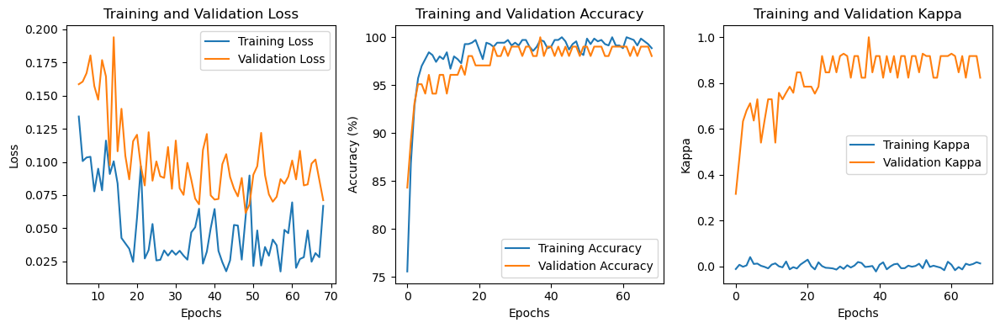

Accuracy of the network on the test set: 98.48484848484848 %, kappa: 0.8720379146919431
[[184   0]
 [  3  11]]
##################################### Iteration  98 #####################################
Epoch [1/10000], Avg. Training Loss: 0.7852071300148964, Training Accuracy: 48.42857142857143%, Avg. Validation Loss: 0.36072974119867596, Validation Accuracy: 89.2156862745098%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.5345544401894916, Training Accuracy: 74.14285714285714%, Avg. Validation Loss: 0.2331116327217647, Validation Accuracy: 94.11764705882354%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3497780063612895, Training Accuracy: 90.57142857142857%, Avg. Validation Loss: 0.21056033564465387, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.32309985770420596, Training Accuracy: 93.85714285714286%, Avg. Validation Loss: 0.15045479046446936, Validation Accuracy: 95.09803921568627%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss:

Epoch [40/10000], Avg. Training Loss: 0.0865312539125708, Training Accuracy: 98.57142857142857%, Avg. Validation Loss: 0.13093855710966246, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [41/10000], Avg. Training Loss: 0.07835321737961336, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.09690994157322816, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [42/10000], Avg. Training Loss: 0.10631284477527846, Training Accuracy: 98.28571428571429%, Avg. Validation Loss: 0.12995826985154832, Validation Accuracy: 95.09803921568627%, lr: 1.0000000000000004e-08
Epoch [43/10000], Avg. Training Loss: 0.09619777459143238, Training Accuracy: 98.42857142857143%, Avg. Validation Loss: 0.08227592201105186, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000004e-08
Epoch [44/10000], Avg. Training Loss: 0.07039585142311724, Training Accuracy: 98.85714285714286%, Avg. Validation Loss: 0.0952535207782473, Validation Accuracy: 97.0

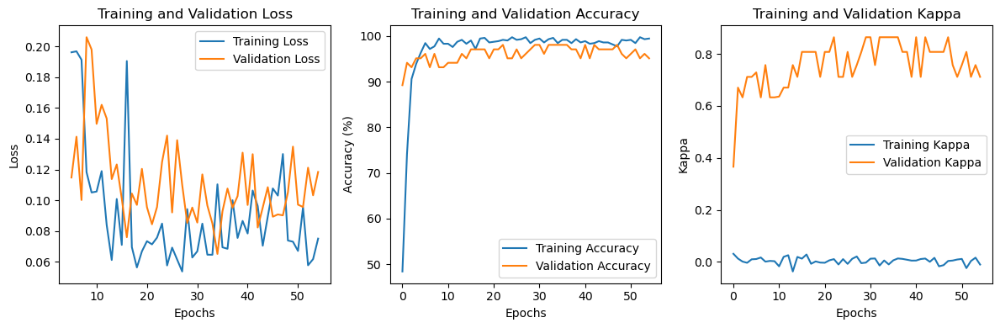

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.769076974341886
[[178   6]
 [  1  13]]
##################################### Iteration  99 #####################################
Epoch [1/10000], Avg. Training Loss: 0.6119208979335699, Training Accuracy: 66.0%, Avg. Validation Loss: 0.4711598541055407, Validation Accuracy: 83.33333333333333%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.4210312102328647, Training Accuracy: 82.28571428571429%, Avg. Validation Loss: 0.2707645722797939, Validation Accuracy: 90.19607843137256%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.29562281376936217, Training Accuracy: 91.71428571428571%, Avg. Validation Loss: 0.1949609305177416, Validation Accuracy: 93.13725490196079%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.24407886375080456, Training Accuracy: 94.57142857142857%, Avg. Validation Loss: 0.2354781883103507, Validation Accuracy: 89.2156862745098%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1911148317158

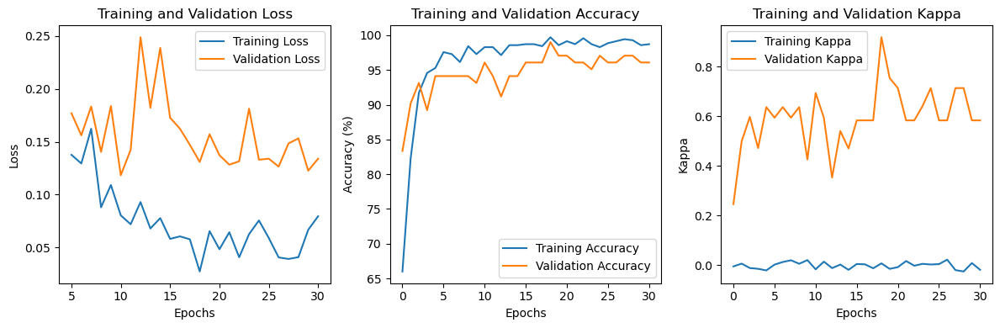

Accuracy of the network on the test set: 96.46464646464646 %, kappa: 0.769076974341886
[[178   6]
 [  1  13]]
##################################### Iteration  100 #####################################
Epoch [1/10000], Avg. Training Loss: 0.5213396000591192, Training Accuracy: 75.85714285714286%, Avg. Validation Loss: 0.6912958792277745, Validation Accuracy: 63.72549019607843%, lr: 0.0002
Epoch [2/10000], Avg. Training Loss: 0.41874035176905716, Training Accuracy: 83.57142857142857%, Avg. Validation Loss: 0.44432580045291353, Validation Accuracy: 93.13725490196079%, lr: 0.0004
Epoch [3/10000], Avg. Training Loss: 0.3114968758415092, Training Accuracy: 91.28571428571429%, Avg. Validation Loss: 0.37210771441459656, Validation Accuracy: 94.11764705882354%, lr: 0.0006
Epoch [4/10000], Avg. Training Loss: 0.2322370491244576, Training Accuracy: 96.0%, Avg. Validation Loss: 0.2745439239910671, Validation Accuracy: 96.07843137254902%, lr: 0.0008
Epoch [5/10000], Avg. Training Loss: 0.1937416890

Epoch [43/10000], Avg. Training Loss: 0.0444539585838687, Training Accuracy: 99.14285714285714%, Avg. Validation Loss: 0.09791691335184234, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-06
Epoch [44/10000], Avg. Training Loss: 0.037683199006344446, Training Accuracy: 99.42857142857143%, Avg. Validation Loss: 0.10700504694666181, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-06
Epoch 00040: reducing learning rate of group 0 to 1.0000e-07.
Epoch [45/10000], Avg. Training Loss: 0.01872080781983889, Training Accuracy: 99.71428571428571%, Avg. Validation Loss: 0.10512065435094493, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [46/10000], Avg. Training Loss: 0.009301633796315979, Training Accuracy: 99.85714285714286%, Avg. Validation Loss: 0.09804451864744936, Validation Accuracy: 98.03921568627452%, lr: 1.0000000000000002e-07
Epoch [47/10000], Avg. Training Loss: 0.07853048433951865, Training Accuracy: 99.0%, Avg. Validation 

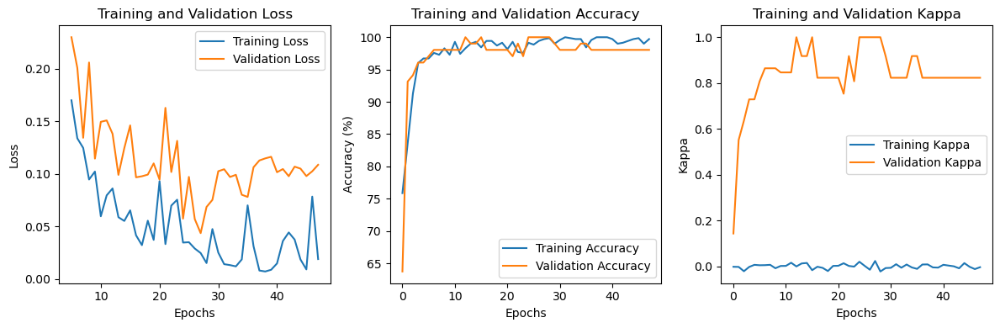

Accuracy of the network on the test set: 97.97979797979798 %, kappa: 0.8557902403495994
[[181   3]
 [  1  13]]


In [8]:
all_data = np.array(data_with_blabel.iloc[:, :], dtype=np.float32)

accuracies = []
kappas = []

fprs = []
tprs = []
fars = []
precisions = []
f1_scores = []
recalls = []
aucs = []

for num_iter in range(100):
    print('##################################### Iteration ', num_iter+1, '#####################################')
    
    # shuffle the data
    np.random.shuffle(all_data)

    # Separate features and labels
    features = all_data[:, :-2]
    labels = all_data[:, -1:]
    multi_labels = all_data[:, -2:-1]

    # Split the data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp, z_train, z_temp = train_test_split(features, labels, multi_labels, test_size=0.3, stratify=multi_labels, random_state=42)
    X_val, X_test, y_val, y_test, z_val, z_test = train_test_split(X_temp, y_temp, z_temp, test_size=0.66, stratify=z_temp, random_state=42)

    # Feature scaling using StandardScaler
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(X_test)

    # Convert to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train_scaled)
    y_train_tensor = torch.FloatTensor(y_train)
    z_train_tensor = torch.FloatTensor(z_train)

    X_val_tensor = torch.FloatTensor(X_val_scaled)
    y_val_tensor = torch.FloatTensor(y_val)

    X_test_tensor = torch.FloatTensor(X_test_scaled)
    y_test_tensor = torch.FloatTensor(y_test)

    # Calculate the class distribution
    class_distribution = np.unique(z_train, return_counts=True)[1]

    # Calculate upsampling weights
    class_weights = 1.0 / torch.tensor(class_distribution, dtype=torch.float32)
    sample_weights = class_weights[z_train_tensor.view(-1).long()]

    # Create a WeightedRandomSampler for training DataLoader
    sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

    # Create TensorDatasets and DataLoaders for training, validation, and test
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, sampler=sampler)
    train_loader2 = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

    # Create model
    model = SimpleNN(input_size).to(device)
    criterion = nn.BCELoss()

    # Exponentially decreasing learning rate
    optimizer = optim.Adam(model.parameters(), lr=target_lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=3, verbose=True)
    # Learning rate warm-up
    warmup_scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: (epoch + 1) / warmup_epochs)

    # Early stopping parameters
    early_stopping_patience = 20
    early_stopping_counter = 0
    best_val_loss = float('inf')

    # Lists to store training and validation losses and accuracies
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []
    train_kappas = []
    val_kappas = []
    epochs = []

    # Training loop
    total_step = len(train_loader)
    for epoch in range(num_epochs):
        total_correct_train = 0
        total_samples_train = 0
        running_loss = 0.0
        predictions_train = []

        # Training
        model.train()
        for i, (real_batch, labels) in enumerate(train_loader):
            # Forward pass
            outputs = model(real_batch)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Log training statistics
            predictions = (outputs > 0.5).float()
            predictions_train.extend(predictions.cpu().numpy())
            total_correct_train += (predictions == labels).sum().item()
            total_samples_train += labels.size(0)
            running_loss += loss.item()

        # Average training loss
        avg_train_loss = running_loss / len(train_loader)
        train_accuracy = 100 * total_correct_train / total_samples_train

        # Calculate Kappa for training set
        kappa_train = cohen_kappa_score(np.concatenate(predictions_train), y_train_tensor.cpu().numpy())
        train_kappas.append(kappa_train)

        # Validation
        model.eval()
        val_running_loss = 0.0
        total_correct_val = 0
        total_samples_val = 0
        predictions_val = []
        with torch.no_grad():
            for val_features, val_labels in val_loader:
                val_outputs = model(val_features)
                val_loss = criterion(val_outputs, val_labels)
                val_running_loss += val_loss.item()

                # Calculate validation accuracy
                val_predictions = (val_outputs > 0.5).float()
                predictions_val.extend(val_predictions.cpu().numpy())
                total_correct_val += (val_predictions == val_labels).sum().item()
                total_samples_val += val_labels.size(0)

        # Average validation loss
        avg_val_loss = val_running_loss / len(val_loader)
        val_accuracy = 100 * total_correct_val / total_samples_val

        # Calculate Kappa for validation set
        kappa_val = cohen_kappa_score(np.concatenate(predictions_val), y_val_tensor.cpu().numpy())
        val_kappas.append(kappa_val)

        last_lr = optimizer.param_groups[0]['lr']
        # Log training and validation statistics
        print(f'Epoch [{epoch+1}/{num_epochs}], Avg. Training Loss: {avg_train_loss}, Training Accuracy: {train_accuracy}%, Avg. Validation Loss: {avg_val_loss}, Validation Accuracy: {val_accuracy}%, lr: {last_lr}')

        # Append losses and accuracies to lists
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)
        epochs.append(epoch)

        # Early stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            early_stopping_counter = 0
        else:
            early_stopping_counter += 1
            if early_stopping_counter >= early_stopping_patience:
                print("Early stopping due to no improvement in validation loss.")
                break

        # Adjust learning rate based on validation loss
        if epoch+1 < warmup_epochs:
            warmup_scheduler.step()  # Use warm-up scheduler
        else:
            scheduler.step(avg_val_loss)  # Use regular scheduler



    # Plotting the curves
    skp_itrs = 5
    plt.figure(figsize=(12, 4))

    # Plotting loss curves
    plt.subplot(1, 3, 1)
    plt.plot(epochs[skp_itrs:], train_losses[skp_itrs:], label='Training Loss')
    plt.plot(epochs[skp_itrs:], val_losses[skp_itrs:], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plotting accuracy curves
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    # Plotting Kappa curves
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_kappas, label='Training Kappa')
    plt.plot(epochs, val_kappas, label='Validation Kappa')
    plt.title('Training and Validation Kappa')
    plt.xlabel('Epochs')
    plt.ylabel('Kappa')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Test the model
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        predictions_test = []
        scores_test = []  # for AUC calculation
        for images, labels in test_loader:
            outputs = model(images)
            
            # Calculate scores for AUC
            scores_test.extend(outputs.cpu().numpy())
            
    #         print((outputs > 0.5).float())
            predictions = (outputs > 0.5).float()  # Binary thresholding for predictions
            predictions_test.extend(predictions.cpu().numpy())
            total += labels.size(0)
            correct += (predictions == labels.float().view(-1, 1)).sum().item()

        kappa_test = cohen_kappa_score(np.concatenate(predictions_test), y_test_tensor.cpu().numpy())
        print('Accuracy of the network on the test set: {} %, kappa: {}'.format(100 * correct / total, kappa_test))
        conf_matrix = confusion_matrix(y_test_tensor.cpu().numpy(), np.concatenate(predictions_test))
        print(conf_matrix)
        
        # Extract values from the confusion matrix
        TN, FP, FN, TP = conf_matrix.ravel()
        
        # Calculate metrics
        fpr = FP / (FP + TN)
        tpr = TP / (TP + FN)
        far = 1 - tpr
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        f1 = 2 * (precision * recall) / (precision + recall)

        fpr_auc, tpr_auc, _ = roc_curve(y_test_tensor.cpu().numpy(), np.concatenate(scores_test))
        roc_auc = auc(fpr_auc, tpr_auc)
        
        accuracies.append(100 * correct / total)
        kappas.append(kappa_test)
        
        fprs.append(fpr)
        tprs.append(tpr)
        fars.append(far)
        precisions.append(precision)
        f1_scores.append(f1)
        recalls.append(recall)
        aucs.append(roc_auc)

In [9]:
{'accuracy': np.mean(accuracies), 'kappa':np.mean(kappas), 'fpr':np.mean(fprs), 'tpr':np.mean(tprs), 'far':np.mean(fars), 'precision':np.mean(precisions), 'recall':np.mean(recalls), 'f1_scores':np.mean(f1_scores), 'auc':np.mean(aucs)}

{'accuracy': 97.29797979797979,
 'kappa': 0.8060490202814699,
 'fpr': 0.017934782608695646,
 'tpr': 0.8535714285714288,
 'far': 0.14642857142857144,
 'precision': 0.8041457672089013,
 'recall': 0.8535714285714288,
 'f1_scores': 0.8204254324738334,
 'auc': 0.9903843167701863}